In [1]:
using Plots, Contour, Distributions, LaTeXStrings
pyplot()

Plots.PyPlotBackend()

# Estimadores de James-Stein

### Motivación empírica Bayesiana

Consideremos el modelo jerárquico Bayesiano

\begin{align*}
\mu & \sim \text{Normal}(m,\sigma^2), &  X | \mu  \sim \text{Normal}(\mu,1)\\
\end{align*}

Dada una observación de X la inferencia Bayesiana se basa en la distribución posterior

$$
\mu | X=x   \sim \text{Normal}\left(m + \frac{\sigma^2}{\sigma^2+1}(x-m), \frac{\sigma^2}{\sigma^2+1}\right)
$$

Podemos tomar la media posterior como estimador de $\mu$,

$$
\hat{\mu}^{(\text{Bayes})} = m +\frac{\sigma^2}{\sigma^2+1}(x-m).
$$

Tenemos que el error cuadrático esperado, también llamada riesgo, está dado por

\begin{align*}
\mathbb{E}\left[ \,\left( \hat{\mu}^{(\text{Bayes})} - \mu \right)^2\, \right] &=
\mathbb{E}\left[ \, \mathbb{E}\left[ \, \left( \hat{\mu}^{(\text{Bayes})} - \mu \right)^2\, \big|\, X=x \,\right]\, \right]  = \frac{\sigma^2 }{\sigma^2+1}
\end{align*}

mientras que para $\hat{\mu}^{(\text{MLE})}=x$

\begin{align*}
\mathbb{E}\left[ \,\left( \hat{\mu}^{(\text{MLE})} - \mu \right)^2\, \right] &=
\mathbb{E}\left[ \, \mathbb{E}\left[ \, \left( \hat{\mu}^{(\text{MLE})} - \mu \right)^2\, \big|\, \mu\,\right]\, \right]  = 1.
\end{align*}

En el caso de que $\sigma^2=1$ tenemos que el "riesgo" de usar el estimador Bayesiano es la mitad que el del estiador máximo verosimil.

Si consideramos $n$ réplicas indepenientes del anterior modelo jerárquico

$$
(\mu_i,X_i) \stackrel{\text{i.i.d.}}{\sim} \mathcal{L}\left( \mu \sim \text{Normal}(m,\sigma^2),\quad
X | \mu \sim \text{Normal}(\mu,1)  \right)
$$

Si observamos $\pmb{X}=\pmb{x}$ entonces definimos análogamente el estimador Bayesiano

$$
\hat{\pmb{\mu}}^{(\text{Bayes})} = \pmb{m} +\frac{\sigma^2}{\sigma^2+1}(\pmb{x}-\pmb{m}).
$$

con $\pmb{m}=m\pmb{1}_n = (m,\ldots,m)$

Se sigue que

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{Bayes})} - \pmb{\mu} \right\|^2\, \right] &=
\mathbb{E}\left[ \, \sum_{i=1}^n \left( \hat{\mu}^{(\text{Bayes})}_i - \mu_i \right)^2  \, \right]  = \frac{n\sigma^2 }{\sigma^2+1}
\end{align*}

y con $\hat{\pmb{\mu}}^{(\text{MLE})}=\pmb{x}$

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{MLE})} - \pmb{\mu} \right\|^2\, \right] &=
\mathbb{E}\left[ \, \sum_{i=1}^n \left( x_i - \mu_i \right)^2  \, \right]  = n.
\end{align*}

El estimador Bayesiano sólo se puede utilizar si se conoce $m$ y $\sigma^2$, sin embargo podemos utilizar las observaciones para estimar insesgdamente $m$ y $\sigma^2$ ya que si

\begin{align*}
\mu & \sim \text{Normal}(m,\sigma^2), & X | \mu \sim \text{Normal}(\mu,1)\\
\end{align*}

entonces marginalmente 

$$
X \sim  \text{Normal}(m,\sigma^2+1).
$$

Se sigue que en el modelo anterior

$$
\bar{X}=\frac{1}{n} \sum_{i=1}^n X_i \sim \text{Normal}\left(m,\frac{\sigma^2+1}{n}\right)
$$

y

$$
\frac{n-1}{\sigma^2+1}\hat{S}^2 = \sum_{i=1}^n \left( X_i - \bar{X} \right)^2 \sim \chi^2_{n-1}
$$

por lo que podemos estimar insesgadamente

$$
m \approx \bar{X}
$$

y utilizando que si $V\sim \chi^2_\nu$ con $\nu>2$ entonces $\mathbb{E}\left[\frac{1}{V} \right]=\frac{1}{\nu-2}$ tenemos que

$$
\frac{\sigma^2}{\sigma^2+1}= 1 - \frac{1}{\sigma^2+1} \approx 1 - \frac{n-3}{(n-1)\hat{S}^2}.
$$

Definimos el estimador de James-Stein (JS) como

$$
\hat{\pmb{\mu}}^{(JS)} = \bar{X}\pmb{1} + \left(1-\frac{n-3}{\|\pmb{X}-\bar{X}\pmb{1}\|^2} \right)\left(\pmb{X}-\bar{X}\pmb{1}\right)
$$

En el contexto frecuentista decimos que estimadores motivados por modelos Bayesianos, como en el presente caso del estimador JS, son empíricamente Bayesianos. Cabe destacar que el estimador de JS no fue propuesto con base a consideraciones Bayesianas, sino desde un enfoque puramente frecuentista.

El riesgo del estimador JS está dado por

$$
\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{JS})} - \pmb{\mu} \right\|^2\, \right] &=
\frac{n\sigma^2}{\sigma^2+1}+\frac{3}{\sigma^2+1}.
\end{align*}
$$

In [1]:
B(s) = s/(s+1)

B (generic function with 1 method)

In [170]:
M = 0.0
n = 20
s = 1.0

1.0

In [171]:
mu = rand(Normal(M,s),n);

In [172]:
x = [ rand(Normal(v,1)) for v in mu ];

In [173]:
sum( (x .- mean(x)).^2.0 )

27.03813275537202

In [52]:
function mujs(x)
    xbar = mean(x)
    S = sum( (x .- xbar).^2.0 )
    return xbar .+ (1--+.0 - (n-3)/S ).*(x .-xbar)
end

mujs (generic function with 1 method)

In [197]:
MClen = 100000
MCvec=  zeros(MClen)
for k in 1:MClen
    mu = rand(Normal(M,s),n)
    x = [ rand(Normal(v,1)) for v in mu ]
    muJS = mujs(x)
    MCvec[k] = sum( (muJS .- mu).^2.0 )
end

In [198]:
mean(MCvec)

11.500892455635844

In [187]:
(s^2+1)*n-2(n-3)+(n-3)/(s^2+1) + n*s^2 -2s^2 -2s^2*(n-1) + 2s^2*(n-3)/(s^2+1)

11.5

In [188]:
MCvecML=  zeros(MClen)
for k in 1:MClen
    mu = rand(Normal(M,s),n)
    x = [ rand(Normal(v,1)) for v in mu ]
    MCvecML[k] = sum( (x .- mu).^2.0 )
end 

In [189]:
mean(MCvecML)

19.987899350344204

In [190]:
MCvecBay=  zeros(MClen)
for k in 1:MClen
    mu = rand(Normal(M,s),n)
    x = [ rand(Normal(v,1)) for v in mu ]
    muBay = M .+ (s^2/(s^2+1))*(x.-M)
    MCvecBay[k] = sum( (muBay .- mu).^2.0 )
end 

In [191]:
mean(MCvecBay)

9.997073562598127

Por ejemplo tomemos $n=20$ y $\sigma^2 = 1$ entonces

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{MLE})} - \pmb{\mu} \right\|^2\, \right] &= n = 20
\\
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{Bayes})} - \pmb{\mu} \right\|^2\, \right] & = \frac{n\sigma^2}{\sigma^2+1}= 10
\\
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{JS})} - \pmb{\mu} \right\|^2\, \right] & = \frac{n\sigma^2}{\sigma^2+1}= \frac{n\sigma^2}{\sigma^2+1}+\frac{3}{\sigma^2+1} = 11.5.
\end{align*}

Podríamos pensar que el anterior análisis es injusto con la estimación ML ya que las observaciones se generan mediante un modelo Bayesiano jerárquico sin embargo resulta que James y Stein demostraron que la estimación ML no es preferible en casos generales.


### Teoremas de James-Stein (I)

Para $n\geq 4$ y $\pmb{\mu}\in\mathbb{R}^n$ arbitrario pero fijo si

$$
\pmb{X}\sim \text{MvNormal}_n(\pmb{\mu},\pmb{I})
$$

y
$$
\hat{\mu}^\text{(JS)}_i = \bar{X}+\left(1 - \frac{n-3}{\sum_{i=1}^n(X_i-\bar{X})^2} \right)(X_i-\bar{X})
$$

satisface 

$$
\mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(JS)} - \pmb{\mu} \|^2 \right] < n = \mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(ML)} - \pmb{\mu} \|^2 \right].
$$

### Teoremas de James-Stein (II)

Para $n\geq 3$ y $\pmb{\mu},\pmb{m}\in\mathbb{R}^n$ arbitrarios pero fijos si

$$
\pmb{X}\sim \text{MvNormal}_n(\pmb{\mu},\pmb{I})
$$

y
$$
\hat{\pmb{\mu}}^\text{(JS)} = \left(1 - \frac{n-2}{\| \pmb{X} \|} \right)\pmb{X}
$$

satisface 

$$
\mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(JS)} - \pmb{\mu} \|^2 \right] < n = \mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(ML)} - \pmb{\mu} \|^2 \right].
$$

$\textbf{dem. Teo.'s estim. James-Stein }$

En general tenemos que el riesgo de un estimador $\hat{\pmb{\mu}}$ par $\pmb{\mu}$ en el problema en cuestión puede expresarse como

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{\mu} \right\|^2\, \right] &= 
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{X} + \pmb{X} - \pmb{\mu} \right\|^2\, \right]
\\ &= \sum_{i=1}^n \left( \mathbb{E}\left[ (\hat{\mu}_i - X_i)^2 \right] + 2\mathbb{E}\left[ (\hat{\mu}_i - X_i)(X_i - \mu_i) \right] + \mathbb{E}\left[ (X_i - \mu_i)^2 \right] \right) 
\\ & = \mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{X} \right\|^2\, \right] + n + 2\sum_{i=1}^n \text{Cov}\left( (\hat{\mu}_i-X_i),(X_i-\mu_i) \right)
\\ & = \mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{X} \right\|^2\, \right] + n + 2\sum_{i=1}^n \left(  \text{Cov}\left( \hat{\mu}_i,X_i \right) - \text{Var}(X_i) \right) 
\\ & = \mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{X} \right\|^2\, \right] - n + 2\sum_{i=1}^n \text{Cov}\left( \hat{\mu}_i,X_i \right)
\end{align*}

Para calcular la covarianza $\text{Cov}\left( \hat{\mu}^{(\text{JS})}_i,x_i \right)$ utilizamos el lemma de Stein.

#### Lemma de Stein

Si $Z\sim\text{Normal}(0,1)$ y $f\,:\,\mathbb{R}\to\mathbb{R}$ con $\mathbb{E}\left[f'(Z)\right]<\infty $ es absolutamente continua entonces 

$$
\mathbb{E}\left[f'(Z)\right]=\mathbb{E}\left[Zf(Z)\right]
$$

**Definición absolutamente continuo**

Sea $I$ un intervalo en $\mathbb{R}$ entonces $f\,:\,I\to\mathbb{R}$ es absolutamente continua si $\forall\,\epsilon>0$ existe $\delta>0$ tal que si una secuencia finta de subintervalos, disjuntos a pares, $\left\{(x_k,y_k)\right\}_{k=1}^n\subset I$, $x_k<y_k$,satisface

$$
{\displaystyle \sum _{k=1}^{n}(y_{k}-x_{k})<\delta }
$$

entonces

$$
{\displaystyle \sum _{k=1}^{n}|f(y_{k})-f(x_{k})|<\varepsilon .}
$$

Para $-\infty<a<b<\infty$ se tiene que si $f$ es absoluatmente conitnua en $(a,b)$ entonces casi en todas partes existe la derivada $f'$ Lebesgue integrable que satisface para $x\in(a,b)$

$$
{\displaystyle f(x) = f(a) + \int_a^x f'(s)\mathrm{d}s }
$$

$\textbf{dem. lemma de Stein}$

\begin{align*}
&\mathbb{E}\left[f'(Z)\right] = \frac{1}{\sqrt{2\pi}}\int_{-\infty}^\infty f'(z)e^{-z^2/2}\mathrm{d}z
\\ & = \frac{1}{\sqrt{2\pi}} \left( \int_{-\infty}^0 f'(z) \left( \int_{-\infty}^z (-w)e^{-w^2/2} \mathrm{d}w \right) \mathrm{d}z + \int_0^\infty f'(z) \left( \int_z^\infty we^{-w^2/2} \mathrm{d}w \right) \mathrm{d}z
\right)
\\ &= \frac{1}{\sqrt{2\pi}} \left( \int_{-\infty}^0 (-w)e^{-w^2/2}  \left( \int_{w}^0  f'(z) \mathrm{d}z\right) \mathrm{d}w+ \int_0^\infty we^{-w^2/2}  \left( \int_0^w f'(z) \mathrm{d}z \right) \mathrm{d}w
\right)
\\ & = \frac{1}{\sqrt{2\pi}}\int_{-\infty}^\infty \left[ f(z)-f(0) \right] ze^{-z^2/2}\mathrm{d}z = \mathbb{E}\left[Zf(Z)\right]
\end{align*}

$\textbf{dem. Teo.'s estim. James-Stein cont.}$

Tenemos que

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{\mu} \right\|^2\, \right] &= \mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{X} \right\|^2\, \right] - n + 2\sum_{i=1}^n \text{Cov}\left( \hat{\mu}_i,X_i \right)
\end{align*}

Por el lemma de Stein obtenemos

\begin{align*}
 &\text{Cov}\left( \hat{\mu}_i,X_i \right)= \text{Cov}\left( \hat{\mu}_i(\pmb{X}),(X_i-\mu_i) \right)
= \mathbb{E}\left[ \hat{\mu}_i(\pmb{X})(X_i-\mu_i) \right]
\\  & \quad \quad\quad  \quad \; = \int \hat{\mu}_i(\pmb{z})(z_i-\mu_i)\prod_{j=1}^n f_Z(z_j-\mu_j)\mathrm{d}\pmb{z}
\\ & \quad\quad  \quad \stackrel{\text{lemm. Stein}}{=} \int \left( \frac{\partial}{\partial z_i} \hat{\mu}_i(\pmb{z}) \right) \prod_{j=1}^n f_Z(z_j-\mu_j)\mathrm{d}\pmb{z} = \mathbb{E}\left[ \frac{\partial}{\partial X_i} \hat{\mu}_i \right]
\end{align*}

$\textbf{dem. Teo. estim. James-Stein (I)}$

En el caso particular de que

$$
\hat{\mu}^\text{(JS)}_i = \bar{X}+\left(1 - \frac{n-3}{\sum_{i=1}^n(X_i-\bar{X})^2} \right)(X_i-\bar{X})
$$

se obtiene

\begin{align*}
 \frac{\partial}{\partial X_i} \hat{\mu}_i^\text{(JS)} 
&=\frac{1}{n} + \left(1 - \frac{n-3}{\sum_{k=1}^n(X_k-\bar{X})^2} \right)\left(1-\frac{1}{n}\right)
+\frac{2(n-3)(1-\frac{1}{n})}{ \left( \sum_{k=1}^n(X_k-\bar{X})^2 \right)^2 }(X_i-\bar{X})^2
\end{align*}

y

\begin{align*}
\sum_{i=1}^n  \frac{\partial}{\partial X_i} \hat{\mu}_i^\text{(JS)} 
&=1 + n\left(1 - \frac{n-3}{\sum_{k=1}^n(X_k-\bar{X})^2} \right)\left(1-\frac{1}{n}\right)
+\frac{2(n-3)(1-\frac{1}{n})}{ \left( \sum_{k=1}^n(X_k-\bar{X})^2 \right)^2 }\sum_{i=1}^n(X_i-\bar{X})^2
\\&=n - \frac{n(n-3)(1-\frac{1}{n}) }{\sum_{k=1}^n(X_k-\bar{X})^2}
+\frac{2(n-3)(1-\frac{1}{n})}{ \sum_{k=1}^n(X_k-\bar{X})^2 }
= n - \frac{(n-3)(n-2)(1-\frac{1}{n}) }{\sum_{k=1}^n(X_k-\bar{X})^2}
\end{align*}

Por otro lado

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{\text{(JS)}} - \pmb{X} \right\|^2\, \right] & =
\mathbb{E}\left[\sum_{i=1}^n\left( \bar{X}+\left(1 - \frac{n-3}{\sum_{i=1}^n(X_i-\bar{X})^2} \right)(X_i-\bar{X}) - X_i \right)^2 \right]
\\ &= \mathbb{E}\left[\sum_{i=1}^n\left( \left( \frac{n-3}{\sum_{i=1}^n(X_i-\bar{X})^2} \right)(X_i-\bar{X}) \right)^2 \right]
= \mathbb{E}\left[ \frac{(n-3)^2}{ \sum_{i=1}^n(X_i-\bar{X})^2 } \right]
\end{align*}

Se sigue que

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{JS})} - \pmb{\mu} \right\|^2\, \right] &= \mathbb{E}\left[\frac{(n-3)^2}{ \sum_{i=1}^n(X_i-\bar{X})^2 } - n + 2\left( n - \frac{(n-3)(n-2)(1-\frac{1}{n}) }{\sum_{k=1}^n(X_k-\bar{X})^2} \right) \right]
\\ & = n - \mathbb{E}\left[\frac{(n-3)\left[ 2(n-2)(1-\frac{1}{n}) - (n-3) \right] }{\sum_{k=1}^n(X_k-\bar{X})^2}\right]
\end{align*}

y observamos que

$$
2(n-2)(1-\frac{1}{n}) - (n-3)  > 0 \iff 2(n-2)(n-1) >n(n-3) \iff 2(n^2 -3n + 2)  > n^2- 3n
$$

por lo cual concluimos que

$$
\mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(JS)} - \pmb{\mu} \|^2 \right] < n = \mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(ML)} - \pmb{\mu} \|^2 \right].
$$

In [2]:
n = 20
μ = rand(Normal(),n)
μ = μ./sqrt( sum( μ.^2 ) );

In [3]:
function mujs_I(x)
    xbar = mean(x)
    S = sum( (x .- xbar).^2.0 )
    return xbar .+ (1.0 - (n-3)/S ).*(x .-xbar)
end

mujs_I (generic function with 1 method)

In [4]:
function MC_mujs_I(m::Int64,n::Int64,μ::Array{Float64,1})
    MCvecI =  zeros(m)
    for k in 1:m
        x = [ rand(Normal(v,1)) for v in μ ]
        muJS = mujs_I(x)
        MCvecI[k] = sum( (muJS .- μ ).^2.0 )
    end
    return mean(MCvecI)
end

MC_mujs_I (generic function with 1 method)

In [5]:
MC_mujs_I(10000,n,μ)

3.8482089256568695

In [6]:
r = LinRange(0.0,15.0,200)

200-element LinRange{Float64, Int64}:
 0.0, 0.0753769, 0.150754, 0.226131, …, 14.7739, 14.8492, 14.9246, 15.0

In [7]:
v_I = [ MC_mujs_I(30000,n,v*μ)  for v in r ];

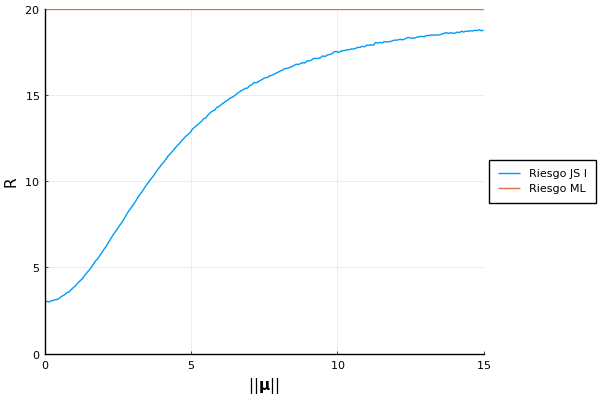

In [22]:
plt=plot(r,v_I,xlim=(0,15),ylim=(0,20),label="Riesgo JS I",legend=:outerright,c=1)
hline!([n],label="Riesgo ML",ylabel="R",xlabel=L"\|| \mathbf{\mu} \||",c=2)

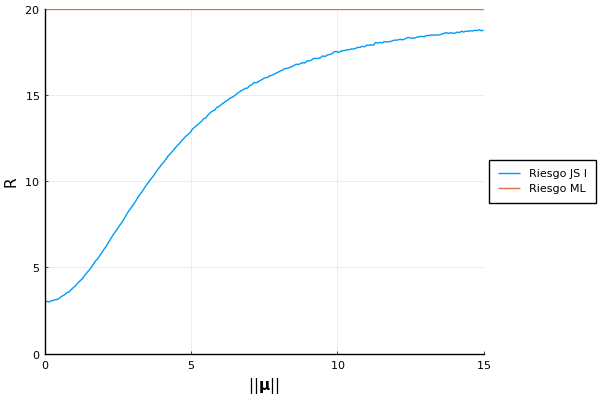

In [23]:
plt

$\textbf{dem. Teo. estim. James-Stein (II)}$

En el caso particular de que

$$
\hat{\pmb{\mu}}^\text{(JS)} = \left(1 - \frac{n-2}{\| \pmb{X} \|^2 } \right)\pmb{X}.
$$

se obtiene

\begin{align*}
 \frac{\partial}{\partial X_i} \hat{\mu}_i^\text{(JS)}
&=\left(1 - \frac{n-2}{\sum_{k=1}^nX_k^2} \right)
+\frac{2(n-2)}{ \left( \sum_{k=1}^nX_k^2 \right)^2 }X_i^2
\end{align*}

y

\begin{align*}
\sum_{i=1}^n\frac{\partial}{\partial X_i} \hat{\mu}_i^\text{(JS)}
&= n\left(1 - \frac{n-2}{\sum_{k=1}^nX_k^2} \right)
+\frac{2(n-2)}{ \left( \sum_{k=1}^nX_k^2 \right)^2 } \sum_{i=1}^nX_i^2
\\&=n - \frac{n(n-2) }{\sum_{k=1}^nX_k^2}
+\frac{2(n-2)}{ \sum_{k=1}^n X_k^2 }
\\&= n - \frac{(n-2)^2 }{\| \pmb{X} \|^2 }
\end{align*}

Por otro lado

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{\text{(JS)}} - \pmb{X} \right\|^2\, \right] & =
\mathbb{E}\left[ \sum_{i=1}^n \left( \frac{n-2}{\sum_{k=1}^nX_k^2} X_i\right)^2 \right]
= \mathbb{E}\left[ \frac{(n-2)^2}{ \|\pmb{X}\|^2 } \right]
\end{align*}

Se sigue que

\begin{align*}
\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}}^{(\text{JS})} - \pmb{\mu} \right\|^2\, \right] &= \mathbb{E}\left[ \frac{(n-2)^2}{ \|\pmb{X}\| } - n + 2\left( n - \frac{(n-2)^2 }{\| \pmb{X} \|^2 } \right) \right]
\\ & = n - \mathbb{E}\left[ \frac{(n-2)^2}{ \|\pmb{X}\|^2 } \right]
\end{align*}

por lo cual concluimos que

$$
\mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(JS)} - \pmb{\mu} \|^2 \right] < n = \mathbb{E}\left[ \| \hat{\pmb{\mu}}^{(ML)} - \pmb{\mu} \|^2 \right].
$$

In [14]:
function mujs_II(x)
    S = sum( (x).^2.0 )
    return (1.0 - (n-2)/S ).*x
end

mujs_II (generic function with 1 method)

In [15]:
function MC_mujs_II(m::Int64,n::Int64,μ::Array{Float64,1})
    MCvecI =  zeros(m)
    for k in 1:m
        x = [ rand(Normal(v,1)) for v in μ ]
        muJS = mujs_II(x)
        MCvecI[k] = sum( (muJS .- μ ).^2.0 )
    end
    return mean(MCvecI)
end

MC_mujs_II (generic function with 1 method)

In [16]:
v_II = [ MC_mujs_II(30000,n,v*μ)  for v in r ];

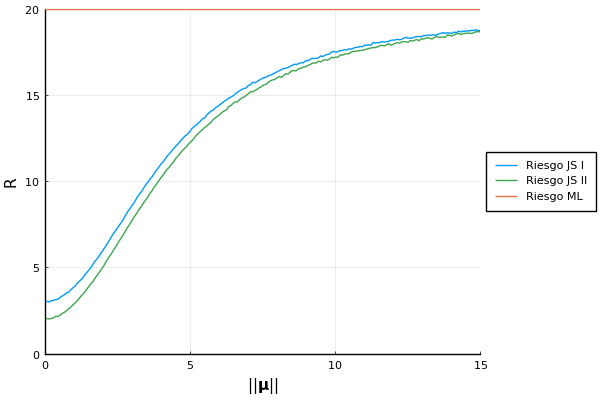

In [19]:
plt=plot(r,v_I,xlim=(0,15),ylim=(0,20),label="Riesgo JS I",legend=:outerright,c=1)
plot!(r,v_II,label="Riesgo JS II",c=3)
hline!([n],label="Riesgo ML",ylabel="R",xlabel=L"\|| \mathbf{\mu} \||",c=2)

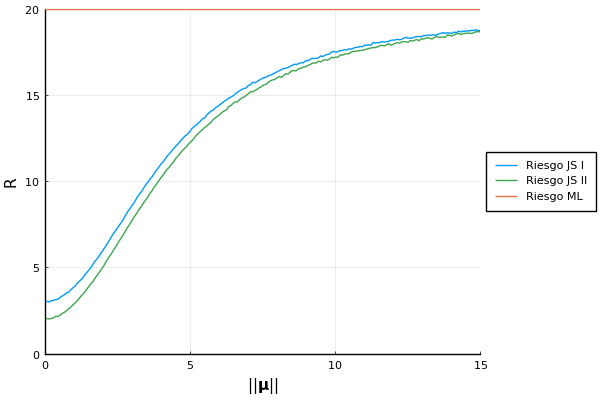

In [20]:
plt

Para la tarea que chequen que James-Stein se satisface con cualquier varianza $\sigma^2$ y valor para centrar

$$
{\displaystyle {\widehat {\boldsymbol {\theta }}}_{JS}=\left(1-{\frac {(n-2)\sigma ^{2}}{\|{\mathbf {x} }-{\boldsymbol {\nu }}\|^{2}}}\right)({\mathbf {x} }-{\boldsymbol {\nu }})+{\boldsymbol {\nu }},\qquad n\geq 3.}
$$

Para la tarea que chequen el caso cuando hay $m$ observaciones $\pmb{X}$:

$$
{\displaystyle {\widehat {\boldsymbol {\theta }}}_{JS}=\left(1-{\frac {(n-2){\frac {\sigma ^{2}}{m}}}{\|{\overline {\mathbf {X} }}\|^{2}}}\right){\overline {\mathbf {X} }},}
$$

donde ahora $\mathbf {X} = \frac{1}{mn}\sum_{j=1}^m \sum_{i=1}^n X_{j,i}$.

Para la tarea que chequen si James-Stein se satisface con ${\displaystyle {\widehat {\sigma }}^{2}={\frac {1}{m}}\sum (X_{i}-{\overline {X}})^{2}}$.

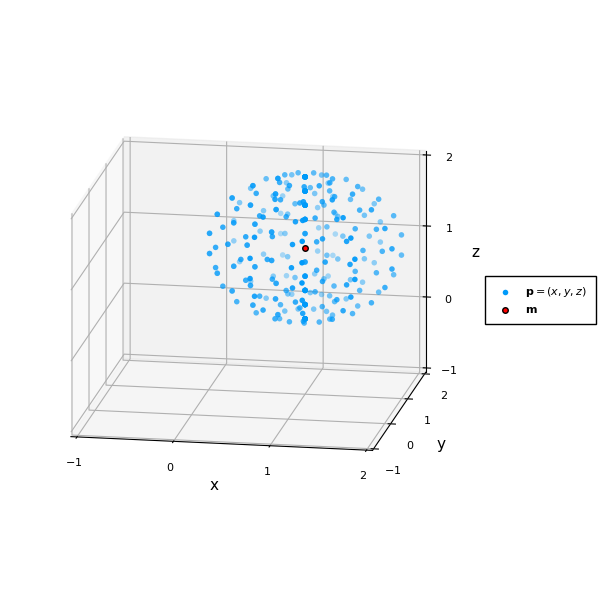

In [24]:
ϕs = range(-π, π, length = 12)
θs = range(0, π, length = 12)
θqs = range(1, π - 1, length = 12)
x = vec([sin(θ) * cos(ϕ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)])
y = vec([sin(θ) * sin(ϕ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)])
z = vec([cos(θ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)])
for r in collect(0.2:0.2:0.8)
    ϕs = range(-π, π, length = floor(Int,r*12))
    θs = range(0, π, length = floor(Int,r*12))
    θqs = range(1, π - 1, length = floor(Int,r*12))
    append!(x,vec([ r* sin(θ) * cos(ϕ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)]))
    append!(y,vec([r*sin(θ) * sin(ϕ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)]))
    append!(z,vec([r*cos(θ) + 1.0 for (ϕ, θ) = Iterators.product(ϕs, θs)]))
end
p1=scatter(x, y, z, markerstrokewidth=0,camera = (10,15),size=(600,600),lims=(-1,2),legend=:outerright,label=L"\mathbf{p}=(x,y,z)",xlabel="x",ylabel="y",zlabel="z")
scatter!( [1.0], [1.0], [1.0], c=:red,label=L"\mathbf{m}")

In [25]:
ρ(a,b,c) = 1 - 1/(a^2+b^2+c^2)  
x_js = zeros(length(x))
y_js = zeros(length(x))
z_js = zeros(length(x))
for i in 1:length(x)
    c = ρ(x[i],y[i],z[i])
    x_js[i] = c*x[i]
    y_js[i] = c*y[i]    
    z_js[i] = c*z[i]    
end

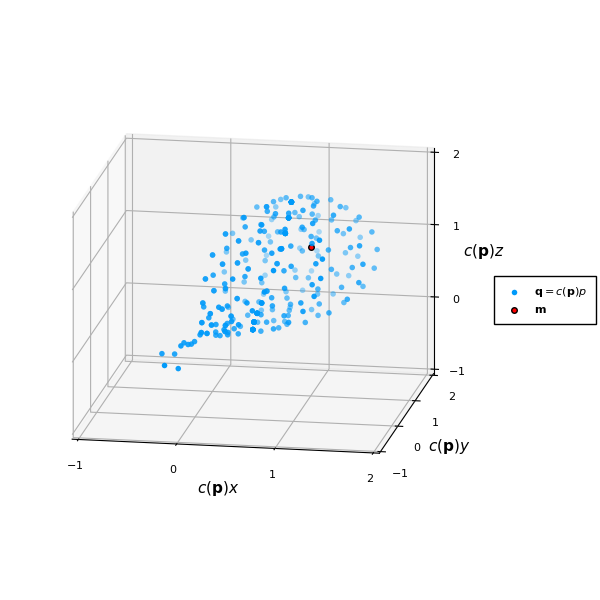

In [26]:
p2=scatter(x_js, y_js, z_js, markerstrokewidth=0,camera = (10,15),size=(600,600),lims=(-1,2),legend=:outerright,label=L"\mathbf{q}=c(\mathbf{p})p",xlabel=L"c(\mathbf{p})x",ylabel=L"c(\mathbf{p})y",zlabel=L"c(\mathbf{p})z")
scatter!( [1.0], [1.0], [1.0], c=:red,label=L"\mathbf{m}")

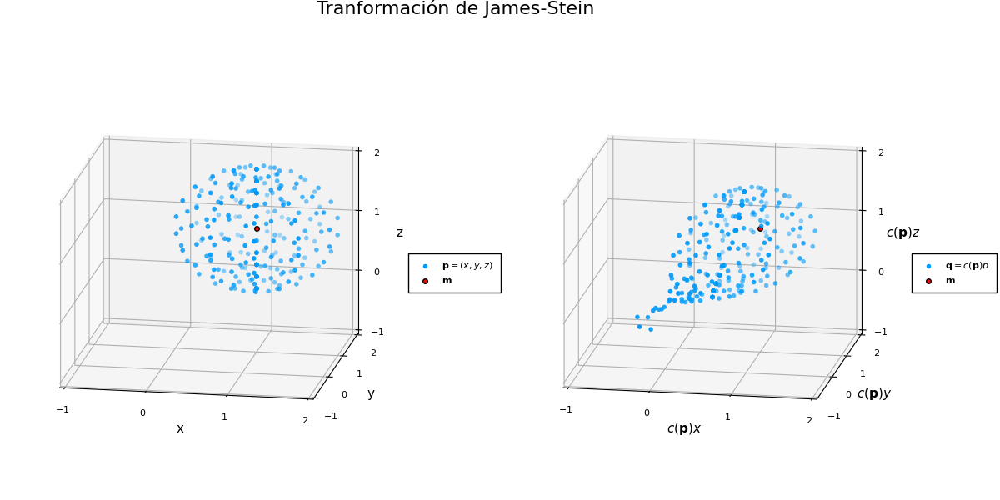

In [27]:
p=plot(p1,p2,layout=(1,2), size=(1200,600),plot_title="Tranformación de James-Stein")

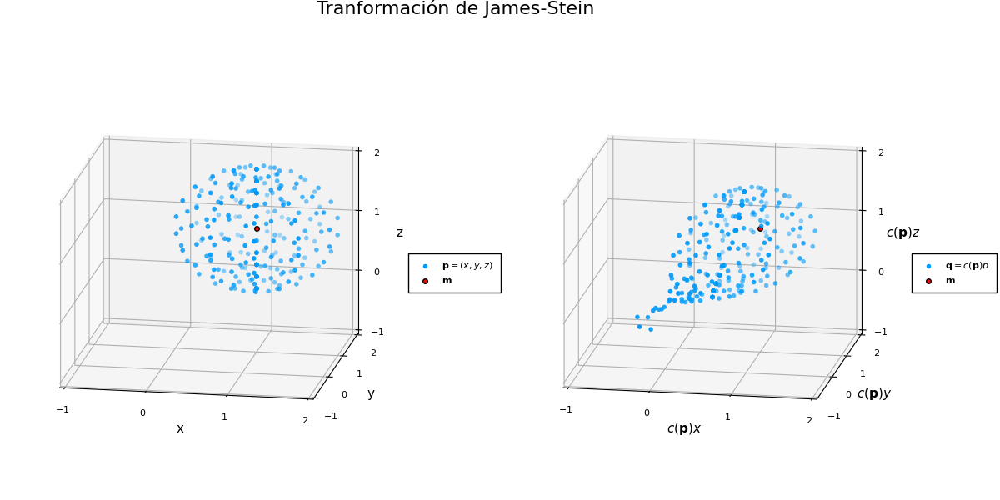

In [28]:
p

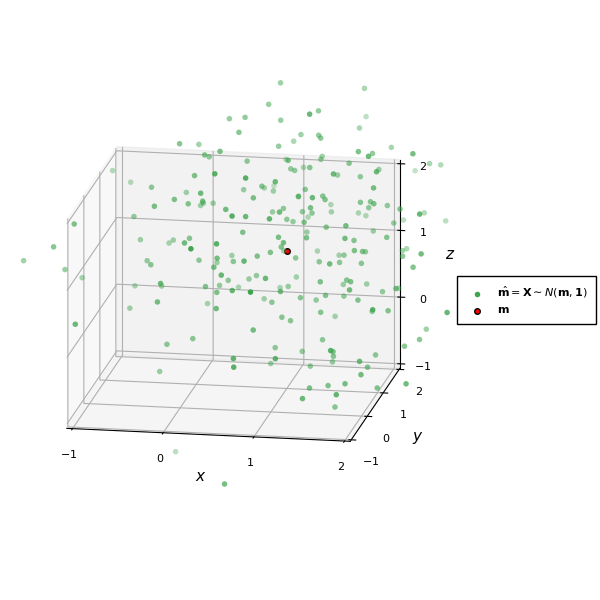

In [29]:
x = rand(Normal(1.0,1.0),240)
y = rand(Normal(1.0,1.0),240)
z = rand(Normal(1.0,1.0),240)
p1=scatter(x, y, z, markerstrokewidth=0,camera = (10,15),size=(600,600),lims=(-1,2),c=3,legend=:outerright,label=L"\hat{\mathbf{m}}=\mathbf{X}\sim N(\mathbf{m},\mathbf{1})",xlabel=L"x",ylabel=L"y",zlabel=L"z")
scatter!( [1.0], [1.0], [1.0], c=:red, label=L"\mathbf{m}")

In [30]:
ρ(a,b,c) = 1 - 1/(a^2+b^2+c^2)  
x_js = zeros(length(x))
y_js = zeros(length(x))
z_js = zeros(length(x))
for i in 1:length(x)
    c = ρ(x[i],y[i],z[i])
    x_js[i] = c*x[i]
    y_js[i] = c*y[i]    
    z_js[i] = c*z[i]    
end

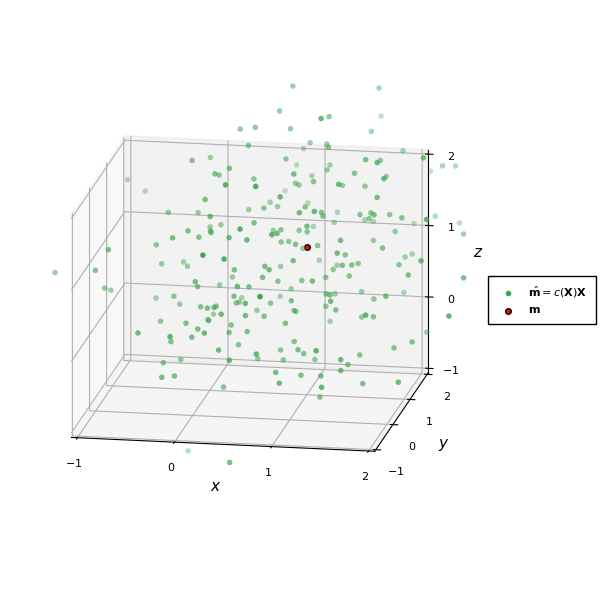

In [31]:
p2=scatter(x_js, y_js, z_js, markerstrokewidth=0,camera = (10,15),size=(600,600),lims=(-1,2),c=3,legend=:outerright,label=L"\hat{\mathbf{m}}=c(\mathbf{X})\mathbf{X}",xlabel=L"x",ylabel=L"y",zlabel=L"z")
scatter!( [1.0], [1.0], [1.0], c=:red, label=L"\mathbf{m}")

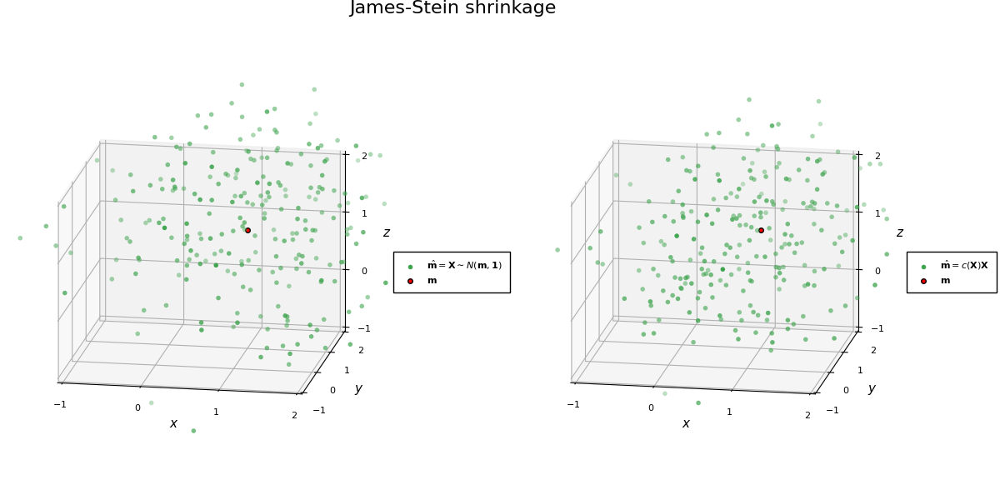

In [32]:
p=plot(p1,p2,layout=(1,2), size=(1200,600),plot_title="James-Stein shrinkage")

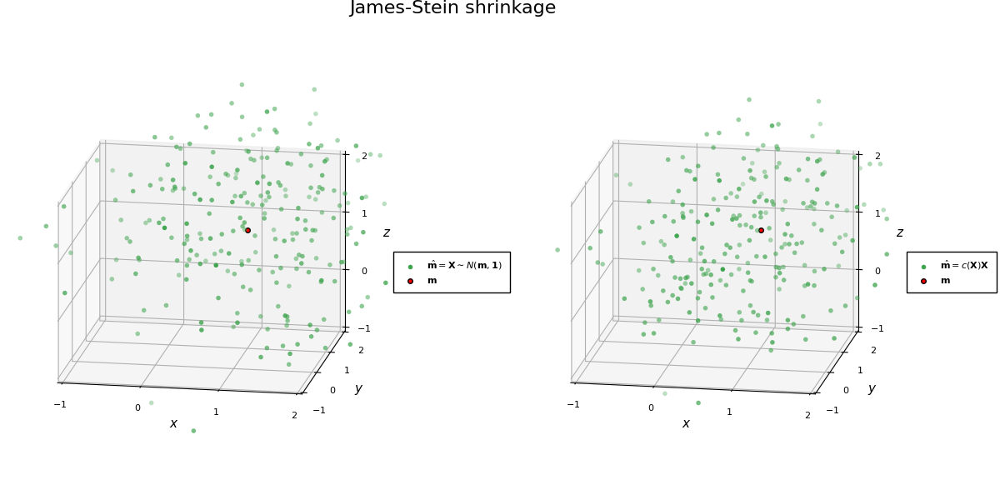

In [33]:
p

Usamos la estimación vía Monte-Carlo para estimar los riesgos

In [44]:
# Estimación riesgo ML
mean([ (x[i]-1)^2 + (y[i]-1)^2 + (z[i]-1)^2 for i in 1:length(x) ])

2.9750730248612034

In [45]:
# Estimación riesgo JS
riesgo_mean([ (x_js[i]-1)^2 + (y_js[i]-1)^2 + (z_js[i]-1)^2 for i in 1:length(x) ])

2.38799940213878

### Balance entre sesgo y varianza

Tenemo que si $\hat{\pmb{\mu}}$ es un estimador arbitrario para $\pmb{\mu}$ entonces

\begin{align*}
&\mathbb{E}\left[ \,\left\| \hat{\pmb{\mu}} - \pmb{\mu} \right\|^2\, \right] = \mathbb{E}\left[ \sum_{i=1}^n \left( \hat{\mu}_i-\mu_i  \right)^2 \right]= \mathbb{E}\left[ \sum_{i=1}^n \left( \hat{\mu}_i - \mathbb{E}\left[ \hat{\mu}_i \right] + \mathbb{E}\left[ \hat{\mu}_i \right] -\mu_i \right)^2 \right]
\\&= \mathbb{E}\left[ \sum_{i=1}^n \left( \hat{\mu}_i - \mathbb{E}\left[ \hat{\mu}_i \right]  \right)^2 \right] + 2\mathbb{E}\left[ \sum_{i=1}^n \left( \hat{\mu}_i - \mathbb{E}\left[ \hat{\mu}_i \right]  \right)\left( \mathbb{E}\left[ \hat{\mu}_i \right]-\mu_i  \right) \right]+ \mathbb{E}\left[ \sum_{i=1}^n \left( \mathbb{E}\left[ \hat{\mu}_i \right]-\mu_i  \right)^2 \right]
\\ &= \sum_{i=1}^n \text{Var}\left( \hat{\mu}_i \right) + \sum_{i=1}^n \left( \mathbb{E}\left[ \hat{\mu}_i \right]-\mu_i  \right)^2  = \sum_{i=1}^n \left( \text{Var}\left( \hat{\mu}_i \right) + \text{Sesgo}(\hat{\mu}_i ,\mu_i)^2 \right)
\end{align*}

Usamos el método Monte-Carlo para estimar sesgo cuadrado y varianza

In [49]:
# Estimación sesgo cuadrado con estimación ML
(mean(x)-1)^2 + (mean(y)-1)^2 + (mean(z)-1)^2 

0.01058377361754209

In [50]:
# Estimación sesgo cuadrado con estimación JS
sesq_(mean(x_js)-1)^2 + (mean(y_js)-1)^2 + (mean(z_js)-1)^2 

0.05601631761893309

In [51]:
# Estimación varianza con estimación ML
var(x) + var(y) + var(z) 

2.9768929719601616

In [52]:
# Estimación varianza con estimación 
var(x_js) + var(y_js) + var(z_js) 

2.3417403359195115

#### Ejemplo jugadores de Baseball

In [70]:
using RDatasets

In [122]:
# Cargamos datos de bateo de baseballistas en la Major League 1970
baseball = dataset("pscl","EfronMorris")

Row,Name,Team,League,R,Y,N,P
,String,Cat…,Cat…,Int32,Float64,Int32,Float64
1,Roberto Clemente,Pitts,NL,18,0.4,367,0.346
2,Frank Robinson,Balt,AL,17,0.378,426,0.298
3,Frank Howard,Wash,AL,16,0.356,521,0.276
4,Jay Johnstone,Cal,AL,15,0.333,275,0.222
5,Ken Berry,Chi,AL,14,0.311,418,0.273
6,Jim Spencer,Cal,AL,14,0.311,466,0.27
7,Don Kessinger,Chi,NL,13,0.289,586,0.263
8,Luis Alvarado,Bos,AL,12,0.267,138,0.21
9,Ron Santo,Chi,NL,11,0.244,510,0.269


Nos interesa hacer inferencia sobre el promedio de bateo $P_i$ de 18 jugadores, $1\leq i\leq 18$, cuando hipotéticamente sólo tenemos acceso al promedio de bateo en las primeras 45 posiciones al bat de los jugadores

$$
p_i = \frac{\#\left\{ \textrm{bateos en las primeras 45 veces al bat} \right\}}{45}.
$$

Modelamos

$$
p_i\sim\textrm{Normal}\left(P_i, \sigma^2_0 \right)
$$

donde $P_i$ es l promedio de bateo en la temporada completa y estimamos $\sigma^2_0\approx\hat{\sigma}^2_0 =\bar{p}(1-\bar{p})/45 $ con lo cual usamos el estimador de James-Stein

$$
\hat{p}_i^{(\text{JS})}=\bar{p} + \left(1-\frac{(n-3)\hat{\sigma}^2_0}{\sum_{i=1}^n (p_i-\bar{p})^2} \right)
(p_i-\bar{p})
$$

In [89]:
p = baseball[:,"Y"]
n = length(p)
mp = mean(p)
sp = mp*(1-mp)/45
S = sum( (p.-mp).^2 )
p_JS = mp .+ (1-(n-3)*sp/S)*(p.-mp)
P = baseball[:,"P"];

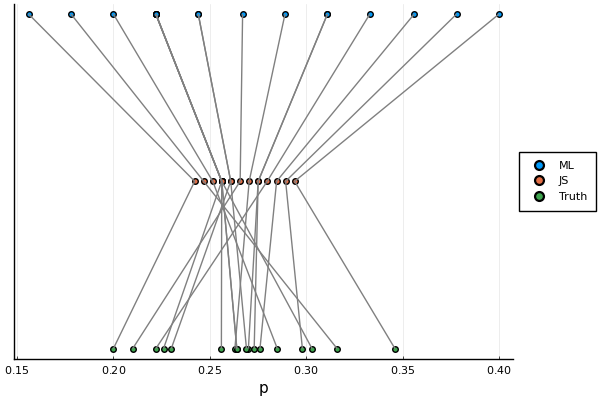

In [94]:
plt=scatter(p, zeros(n).+3,legend=:outerright,label="ML",yticks=false,xlabel="p")
scatter!(p_JS, zeros(n).+2,label="JS")
scatter!(P, zeros(n).+1,label="Truth")
for i in 1:n
    plot!([P[i],p_JS[i],p[i]],[1,2,3],label="",c=:gray)
end
plt

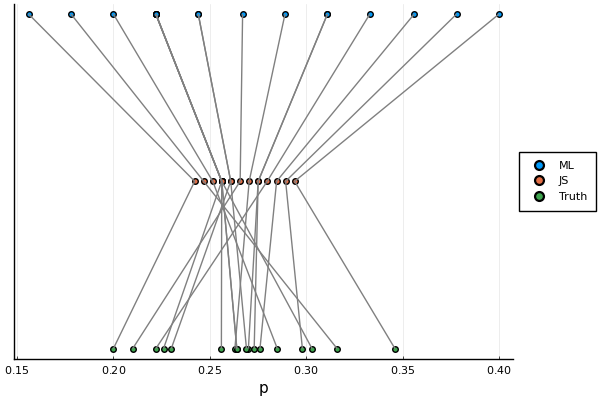

In [95]:
plt

# Regresión Ridge

Consideramos el modelo Bayesiano


\begin{align*}
\\ \pmb{\beta} &\sim \text{Normal}\left(\pmb{0}, \frac{1}{2 \tau^2}\pmb{I}_p \right)
\\ \pmb{y}\,|\,\pmb{\beta},\hat{\pmb{X}} \,&\sim \text{Normal}\left(\hat{\pmb{X}}\pmb{\beta},\sigma^2\pmb{I}_n\right)
\end{align*}

con $\tau^2,\sigma^2>0.$

Entonces 

$$
p(\pmb{\beta}|\pmb{D})\propto \exp\left( - \frac{1}{2\sigma^2}\sum_{i=1}^n \left(y_i-\pmb{X}_i'\pmb{\beta} \right)^2 \right)
\exp\left( - \tau^2 \sum_{j=0}^p \beta_j^2 \right)
$$

El estimador máximo a posteriori está dado por

\begin{align*}
\hat{\pmb{\beta}}^{(\text{MAXPOST})} &= \underset{\pmb{\beta}}{\arg \max} \;p(\pmb{\beta}|\pmb{D})
\\ & =  \underset{\pmb{\beta}}{\arg \min}  \left[ \left( \sum_{i=1}^n \left(y_i-\pmb{X}_i'\pmb{\beta} \right)^2 \right) + \lambda \sum_{j=0}^p \beta_j^2 \right]
\\ & =  \underset{\pmb{\beta}}{\arg \min} \left( \left\| \pmb{y}-\hat{\pmb{X}}\pmb{\beta} \right \|_2^2  + \lambda \left\| \pmb{\beta} \right\|_2^2 \right)
\end{align*}

con $\lambda= \left(\frac{\sigma}{\tau}\right)^2$.

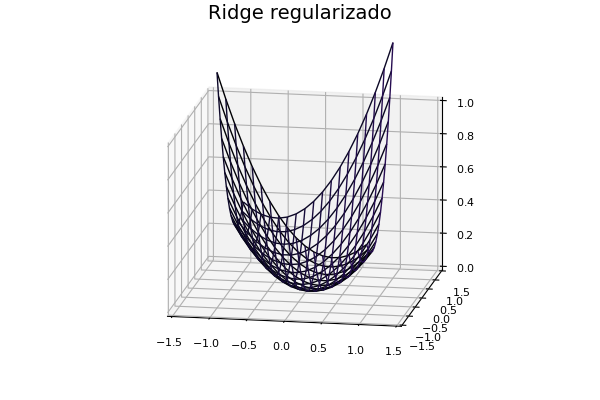

In [123]:
import Contour.levels, Contour.contours, Contour.level, Contour.lines, Contour.coordinates
g_x = g_y =  range(-1.0, 1.0, length = 18)
h1(x, y) = (0.5*(x + y))^2.0
h2(x, y) = (0.5*(x + y))^2.0 + 0.2*(x^2.0 + y^2.0)
p1=plot(g_x, g_y, h1, xlim = (-1.5, 1.5), ylim = (-1.5, 1.5), zlim = (0, 1), camera = (10, 14), seriestype=:wireframe, colorbar=false, legend=:outerright, title="Ridge")
p2=plot(g_x, g_y, h2, xlim = (-1.5, 1.5), ylim = (-1.5, 1.5), zlim = (0, 1), camera = (10, 14), seriestype=:wireframe, colorbar=false, legend=:outerright, title="Ridge regularizado")

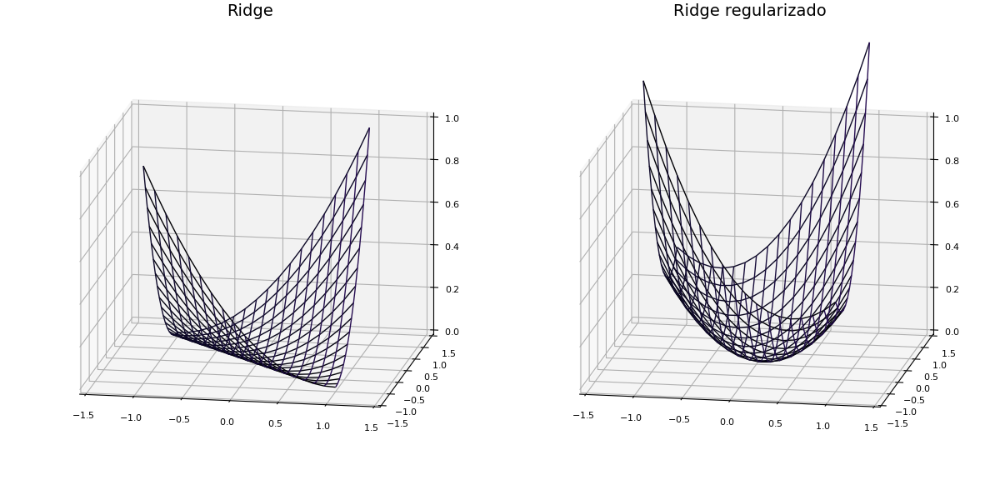

In [124]:
plt=plot(p1,p2,layout=(1,2), size=(1200,600))

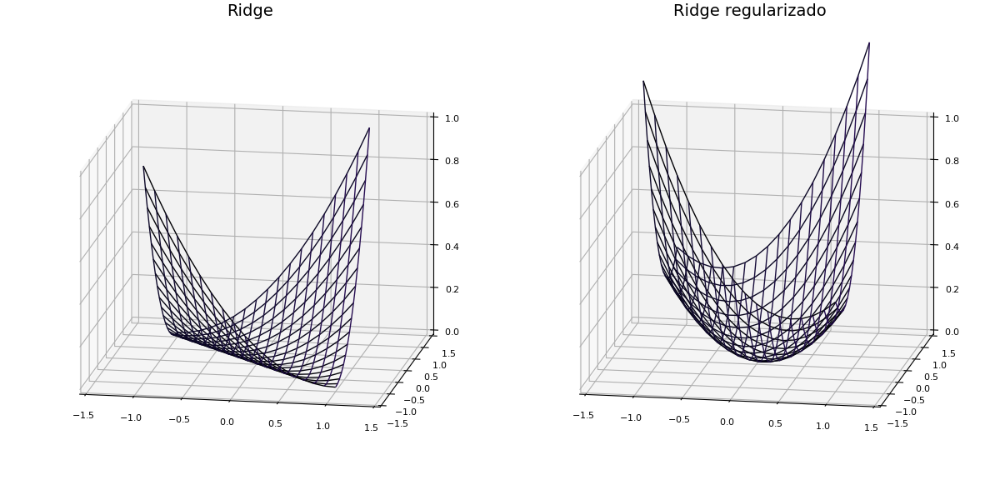

In [125]:
plt

El estimador máximo a posteriori está dado por

$$
\hat{\pmb{\beta}}^{(\text{MAP})} = \left( \pmb{X}'\pmb{X} + \lambda\pmb{I}_p \right)^{-1}\pmb{X}'\pmb{y}, \quad \hat{\beta}^{(\text{MAP})}_0 = \bar{y}.
$$

<table><tr>
<td> <img src="../Art/ridge.jpeg" alt="Drawing" style="width: 450px;"/> </td>
<td> <img src="../Art/ridgeback.jpg" alt="Drawing" style="width: 500px;"/> </td>
</tr></table>

Para calcular numéricamente el estimador $\hat{\pmb{\beta}}^{(\text{MAP})}$ consideramos

$$
\tilde{\pmb{X}} = \left( \begin{matrix}  \frac{1}{\sigma}\pmb{X} \\ \frac{1}{\tau}\pmb{I}_p   \end{matrix}\right)
,\quad \tilde{\pmb{y}} = \left( \begin{matrix}  \frac{1}{\sigma}\pmb{y} \\ \pmb{0}_{p\times 1}   \end{matrix}\right)
$$

con lo cual obtenemos un problema de mínimos cuadrados que puede ser calculado haciendo uso de la descomposición QR

\begin{align*}
\left( \tilde{\pmb{y}}-\tilde{\pmb{X}}\pmb{\beta} \right)'\left( \tilde{\pmb{y}}-\tilde{\pmb{X}}\pmb{\beta} \right)
& = \left( \left( \begin{matrix}  \frac{1}{\sigma}\pmb{y} \\ \pmb{0}_{p\times 1}   \end{matrix}\right) - 
\left( \begin{matrix}  \frac{1}{\sigma}\pmb{X} \\ \frac{1}{\tau}\pmb{I}_p   \end{matrix}\right) \pmb{\beta} \right)'\left( \left( \begin{matrix}  \frac{1}{\sigma}\pmb{y} \\ \pmb{0}_{p\times 1}   \end{matrix}\right) - 
\left( \left( \begin{matrix}  \frac{1}{\sigma}\pmb{X} \\ \frac{1}{\tau}\pmb{I}_p   \end{matrix}\right) \pmb{\beta} \right) \right)
\\ & = \left( \begin{matrix}  \frac{1}{\sigma}\left( \pmb{y} - \pmb{X}\pmb{\beta} \right) \\ -\frac{1}{\tau}\pmb{\beta}   \end{matrix}\right)'\left( \begin{matrix}  \frac{1}{\sigma}\left( \pmb{y} - \pmb{X}\pmb{\beta} \right) \\ -\frac{1}{\tau}\pmb{\beta}   \end{matrix}\right) = \frac{1}{\sigma^2}\left( \pmb{y} - \pmb{X}\pmb{\beta}  \right)'\left( \pmb{y} - \pmb{X}\pmb{\beta}  \right) + \frac{1}{\tau^2}\pmb{\beta}'\pmb{\beta}
\end{align*}

Por lo que altternativamente se puede calcular

$$
\hat{\pmb{\beta}}^{(\text{MAP})} = \left( \tilde{\pmb{X}}'\tilde{\pmb{X}} \right)^{-1}\tilde{\pmb{X}}'\tilde{\pmb{y}}
$$

In [1]:
using Distributions, Plots, LaTeXStrings, LinearAlgebra
pyplot()

Plots.PyPlotBackend()

## Ejemplo regresión polinomial para función trigonométrica

En la regresión polinomial, dados covariables $\pmb{X}$ consideramos monomios asociados como covariables extra. En el ejemplo más sencillo tenemos un único covariable $x$ que extendemos a $\pmb{X}=(x,x^2,x^3,\ldots,x^p)$ donde $p$ es llamado el grado de la regresión polinomial. Por ejemplo si observamos la función $y(x)=\sin(x)$ ruidosamente en $n$ puntos $x_1,\ldots, x_n$ con $\left\{\epsilon_i \right\}_{i=1}^n\stackrel{\text{i.i.d.}}{\sim}\text{Normal}(0,\sigma^2)$

$$
y_i = \sin(x_i) + \epsilon_i \approx \hat{y}_i = \beta_0 + \beta_1 x_i + \beta_2 x_i^2 + \ldots+ \beta_p x_i^p.
$$

In [2]:
l = 2π/8
x = 0.0:l:2π
v = 0.0:0.01:2π
n = length(x)
σ = 0.25
d = [ sin(i) .+ rand(Normal(0.0,σ)) for i in x ];

In [3]:
λ = 1.0
p = 10
Φ₉ = zeros(n,p)
for i in 1:n
    for j in 1:p
        Φ₉[i,j] = x[i]^(j-1)
    end
end
w₉ = inv( Φ₉'* Φ₉ ) *  Φ₉' * d
w₉r = inv( Φ₉'* Φ₉ + λ*I ) *  Φ₉' * d
pol9(x) = dot(w₉,x.^(0:1:9) )
pol9r(x) = dot(w₉r,x.^(0:1:9) )

pol9r (generic function with 1 method)

In [4]:
p = 5
Φ₄ = zeros(n,p)
for i in 1:n
    for j in 1:p
        Φ₄[i,j] = x[i]^(j-1)
    end
end
w₄ = inv( Φ₄'* Φ₄ ) *  Φ₄' * d
w₄r = inv( Φ₄'* Φ₄ + λ*I ) *  Φ₄' * d
pol4(x) = dot(w₄,x.^(0:1:4) )
pol4r(x) = dot(w₄r,x.^(0:1:4) )

pol4r (generic function with 1 method)

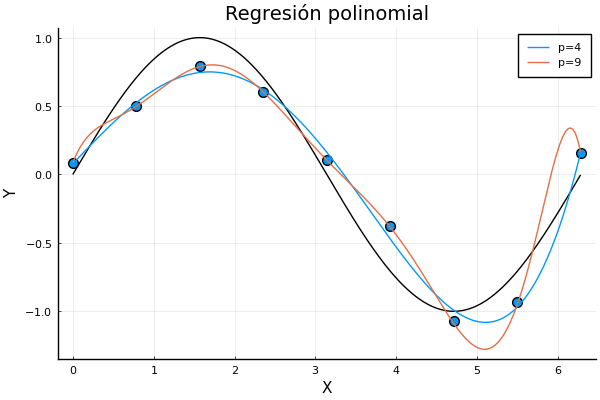

In [5]:
plt = scatter(x,d,markersize=7,mc=1,label="",title="Regresión polinomial")
plot!(plt,v, sin.(v),color=:black,label="")
plot!(plt,v, pol4.(v),color=1,label="p=4")
plot!(plt,v, pol9.(v),color=2,label="p=9")
xlabel!(plt,"X")
ylabel!(plt,"Y")

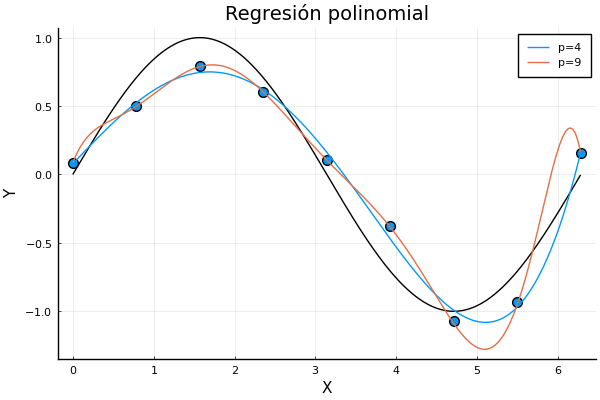

In [6]:
plt

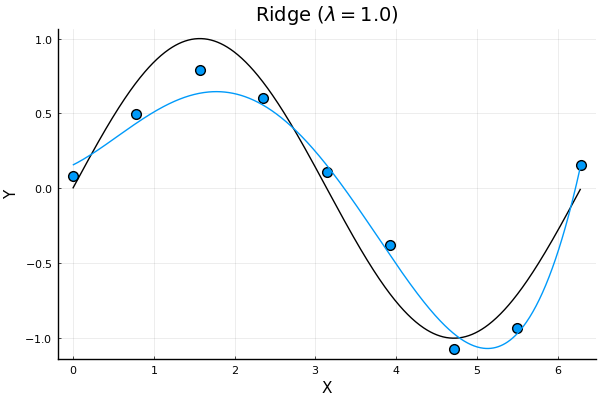

In [7]:
plt9 = scatter(x,d,markersize=7,mc=1,label="",title=latexstring("Lineal (\$ \\lambda = 0 \$)"))
plot!(plt9,v, sin.(v),color=:black,label="")
plot!(plt9,v, pol9.(v),color=1,label="")
xlabel!(plt9,"X")
ylabel!(plt9,"Y")
plt9ridge = scatter(x,d,markersize=7,mc=1,label="",title=latexstring("Ridge (\$ \\lambda = $(λ) \$)"))
plot!(plt9ridge,v, sin.(v),color=:black,label="")
plot!(plt9ridge,v, pol9r.(v),color=1,label="")
xlabel!(plt9ridge,"X")
ylabel!(plt9ridge,"Y")
plt4 = scatter(x,d,markersize=7,mc=1,label="",title=latexstring("Lineal (\$ \\lambda = 0 \$)"))
plot!(plt4,v, sin.(v),color=:black,label="")
plot!(plt4,v, pol4r.(v),color=1,label="")
xlabel!(plt4,"X")
ylabel!(plt4,"Y")
plt4ridge = scatter(x,d,markersize=7,mc=1,label="",title=latexstring("Ridge (\$ \\lambda = $(λ) \$)"))
plot!(plt4ridge,v, sin.(v),color=:black,label="")
plot!(plt4ridge,v, pol4r.(v),color=1,label="")
xlabel!(plt4ridge,"X")
ylabel!(plt4ridge,"Y")

In [8]:
for k in 2:3
    d = [ sin(i) .+ rand(Normal(0.0,0.25)) for i in x ]
    p = 10
    Φ₉ = zeros(n,p)
    for i in 1:n
        for j in 1:p
            Φ₉[i,j] = x[i]^(j-1)
        end
    end
    w₉ = inv( Φ₉'* Φ₉ ) *  Φ₉' * d
    w₉r = inv( Φ₉'* Φ₉ + λ*I ) *  Φ₉' * d
    p = 5
    Φ₄ = zeros(n,p)
    for i in 1:n
        for j in 1:p
            Φ₄[i,j] = x[i]^(j-1)
        end
    end
    w₄ = inv( Φ₄'* Φ₄ ) *  Φ₄' * d
    w₄r = inv( Φ₄'* Φ₄ + λ*I ) *  Φ₄' * d
    pol9(x) = dot(w₉,x.^(0:1:9) )
    pol9r(x) = dot(w₉r,x.^(0:1:9) )
    pol4(x) = dot(w₄,x.^(0:1:4) )
    pol4r(x) = dot(w₄r,x.^(0:1:4) )
    scatter!(plt9,x,d,markersize=7,mc=k,label="")
    scatter!(plt9ridge,x,d,markersize=7,mc=k,label="")
    scatter!(plt4,x,d,markersize=7,mc=k,label="")
    scatter!(plt4ridge,x,d,markersize=7,mc=k,label="")
    plot!(plt9,v, pol9.(v),color=k,label="")
    plot!(plt4,v, pol4.(v),color=k,label="")
    plot!(plt9ridge,v, pol9r.(v),color=k,label="")
    plot!(plt4ridge,v, pol4r.(v),color=k,label="")
end

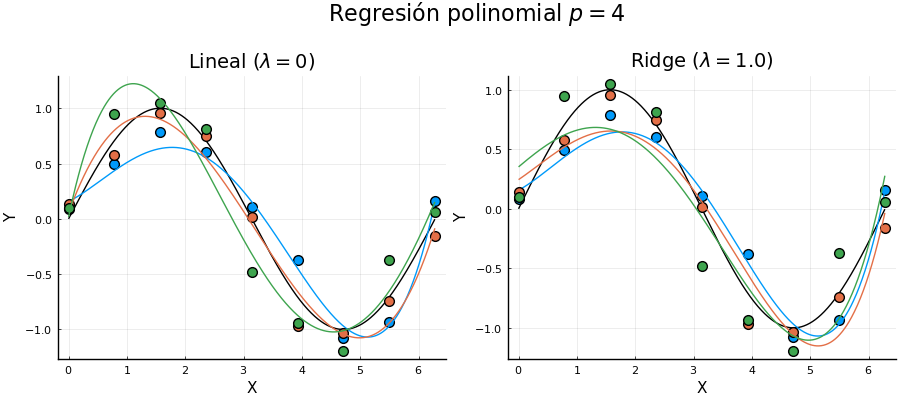

In [9]:
plt4_c = plot(plt4,plt4ridge,size=(900,400),plot_title=latexstring("Regresión polinomial \$p=4\$"))

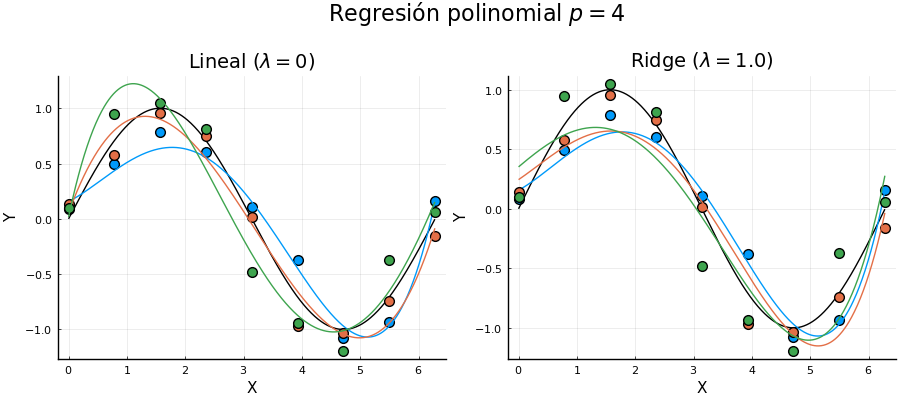

In [10]:
plt4_c

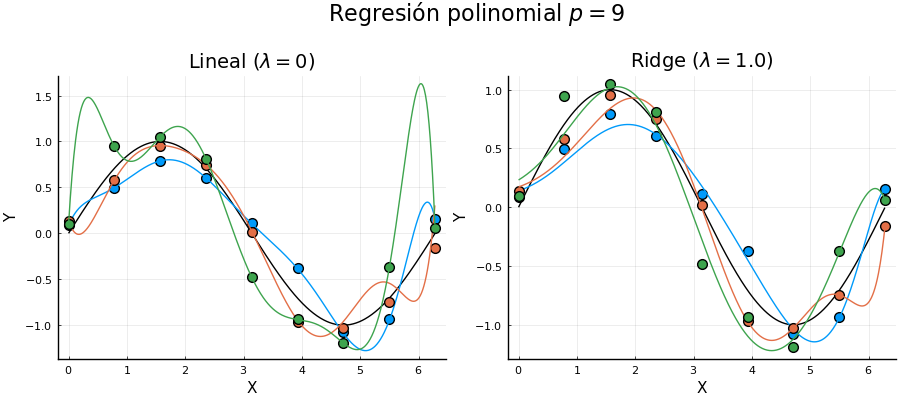

In [11]:
plt9_c = plot(plt9,plt9ridge,size=(900,400),plot_title=latexstring("Regresión polinomial \$ p = 9\$"))

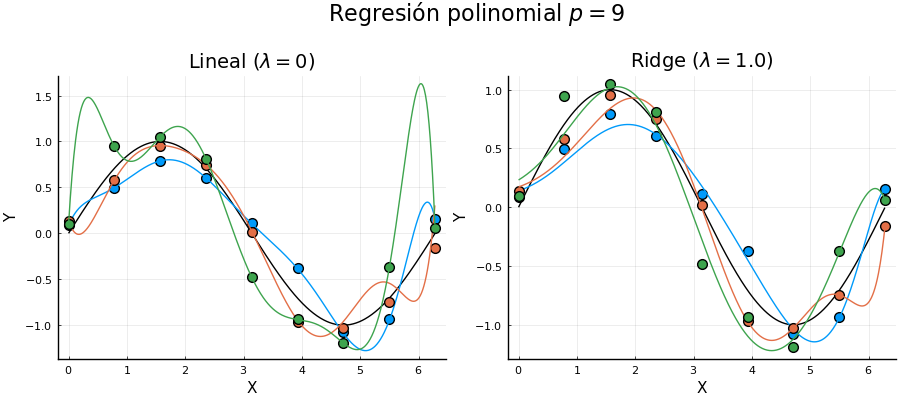

In [12]:
plt9_c

In [13]:
function poldegpfit(p::Int64,y::Array{Float64,1},x::Array{Float64,1},λ::Float64=0.0)
    n =length(x)
    p = p+1
    Φ = zeros(n,p)
    for i in 1:n
        for j in 1:p
            Φ[i,j] = x[i]^(j-1)
        end
    end
    w = inv( Φ'* Φ + λ*I  ) *  Φ' * y
    return z -> dot(w,z.^(0:1:(p-1)) )
end

poldegpfit (generic function with 2 methods)

In [14]:
function MCmatforMSE(λ::Float64,n::Int64,x::Array{Float64,1},p1::Int64,p2::Int64,t::Array{Float64,1})
    m = length(t)
    M_1 = zeros(n,m)
    M_2 = zeros(n,m)
    M_1_r = zeros(n,m)
    M_2_r = zeros(n,m)
    for i in 1:n
        y = [ sin(i) .+ rand(Normal(0.0,σ)) for i in x ]
        pol1 = poldegpfit(p1,y,x)
        pol1r = poldegpfit(p1,y,x,λ)
        pol2 = poldegpfit(p2,y,x)
        pol2r = poldegpfit(p2,y,x,λ)
        M_1[i,:] = pol1.(t)
        M_1_r[i,:] = pol1r.(t)
        M_2[i,:] = pol2.(t)
        M_2_r[i,:] = pol2r.(t)
    end
    return M_1, M_1_r, M_2, M_2_r
end

MCmatforMSE (generic function with 1 method)

In [15]:
t_mc = collect(0.0:0.04:2π)
M_4, M_4_r, M_9, M_9_r = MCmatforMSE(1.0,100000,collect(x),4,9,t_mc)

([-0.19789317231282588 -0.10792667753919921 … -0.06906169577682597 -0.02402892830667014; 0.3100703648438916 0.3484697695543631 … -0.08961267607633339 0.0031934219984961487; … ; -0.1650375077036461 -0.06127600760653898 … -0.12063978694516919 -0.08870985504865914; -0.16305947014232558 -0.08860948548246074 … -0.06035369243734956 0.007612777621634481], [0.20194198851079426 0.2183649115416625 … -0.008893559179082189 0.07352750567232746; 0.34148445948001616 0.3536237906997274 … -0.07138185101344874 0.035293052090874966; … ; 0.27055868325605603 0.2892901113709155 … -0.04718492475774738 0.029464824354821673; 0.17504427603534234 0.19117862475951033 … -0.02282019735969243 0.07149563531316261], [-0.21369512555077108 0.2143238413435635 … 1.1560591720208322 0.45331377733600675; 0.3184788703972572 0.7800831547247861 … 0.43933271157402487 0.009764402338987566; … ; -0.1585858402179383 0.14209815976620216 … -0.10788936433209528 -0.09236572902409534; -0.18354016891339597 -0.12054701150287923 … -0.135838

En este caso el riesgo, o error cuadrático medio, está dado por


\begin{align*}
&\mathbb{E}\left[ \,\left\| \hat{f} - f \right\|_2^2\, \right] = \mathbb{E}\left[ \int \left( \hat{f}(x)-f(x)  \right)^2 \mathrm{d}x \right]= \mathbb{E}\left[ \int \left( \hat{f}(x) - \mathbb{E}\left[ \hat{f}(x) \right] + \mathbb{E}\left[ \hat{f}(x) \right] - f(x) \right)^2 \mathrm{d}x \right]
\\&= \mathbb{E}\left[ \int \left( \hat{f}(x) - \mathbb{E}\left[ \hat{f}(x) \right]  \right)^2 \mathrm{d}x \right] + 2\mathbb{E}\left[ \int \left( \hat{f}(x) - \mathbb{E}\left[ \hat{f}(x) \right]  \right)\left( \mathbb{E}\left[ \hat{f}(x) \right]- f(x)  \right) \mathrm{d}x \right]+ \mathbb{E}\left[ \int\left( \mathbb{E}\left[ \hat{f}(x) \right]-f(x)  \right)^2 \mathrm{d}x \right]
\\ &= \int \text{Var}\left( \hat{f}(x) \right)\mathrm{d}x + \int \left( \mathbb{E}\left[ \hat{f}(x) \right] - f(x)  \right)^2  = \int \left( \text{Var}\left( \hat{f}(x) \right) + \text{Sesgo}(\hat{f}(x) ,f(x))^2 \right)\mathrm{d}x
\end{align*}

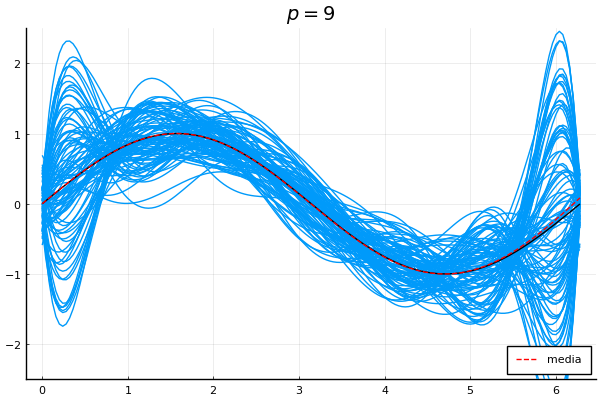

In [16]:
plt9_mc = plot(t_mc,M_9[500:1000:100000,:][1,:],label="",c=1,ylim=(-2.5,2.5),title=L"p=9")
for i in 2:99
   plot!(plt9_mc,t_mc,M_9[500:1000:100000,:][i,:],label="",c=1)
end
plot!(plt9_mc,v, sin.(v),color=:black,label="")
plot!(plt9_mc,t_mc,mean(M_9,dims=1)[1:end],c=:red,label="media",linestyle=:dash,legend=:bottomright)

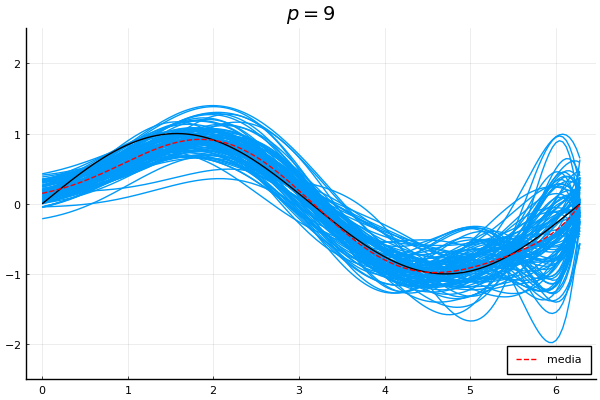

In [17]:
plt9r_mc = plot(t_mc,M_9_r[500:1000:100000,:][1,:],label="",c=1,ylim=(-2.5,2.5),title=L"p=9")
for i in 2:99
   plot!(plt9r_mc,t_mc,M_9_r[500:1000:100000,:][i,:],label="",c=1)
end
plot!(plt9r_mc,v, sin.(v),color=:black,label="")
plot!(plt9r_mc,t_mc,mean(M_9_r,dims=1)[1:end],c=:red,label="media",linestyle=:dash,legend=:bottomright)

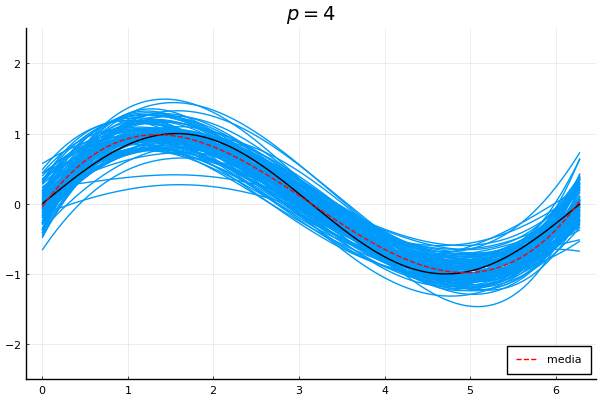

In [18]:
plt4_mc = plot(t_mc,M_4[500:1000:100000,:][1,:],label="",c=1,ylim=(-2.5,2.5),title=L"p=4")
for i in 2:99
   plot!(plt4_mc,t_mc,M_4[500:1000:100000,:][i,:],label="",c=1)
end
plot!(plt4_mc,v, sin.(v),color=:black,label="")
plot!(plt4_mc,t_mc,mean(M_4,dims=1)[1:end],c=:red,label="media",linestyle=:dash,legend=:bottomright)

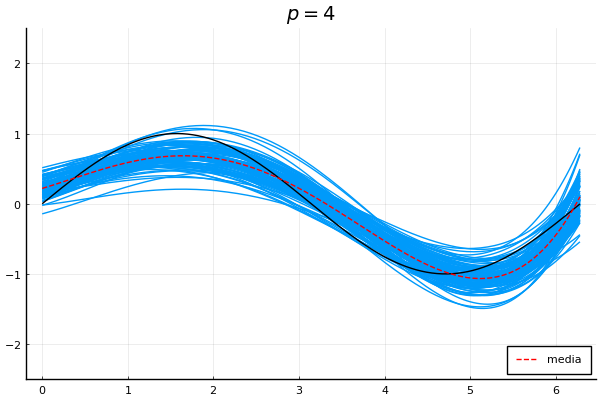

In [19]:
plt4r_mc = plot(t_mc,M_4_r[500:1000:100000,:][1,:],label="",c=1,ylim=(-2.5,2.5),title=L"p=4")
for i in 2:99
   plot!(plt4r_mc,t_mc,M_4_r[500:1000:100000,:][i,:],label="",c=1)
end
plot!(plt4r_mc,v, sin.(v),color=:black,label="")
plot!(plt4r_mc,t_mc,mean(M_4_r,dims=1)[1:end],c=:red,label="media",linestyle=:dash,legend=:bottomright)

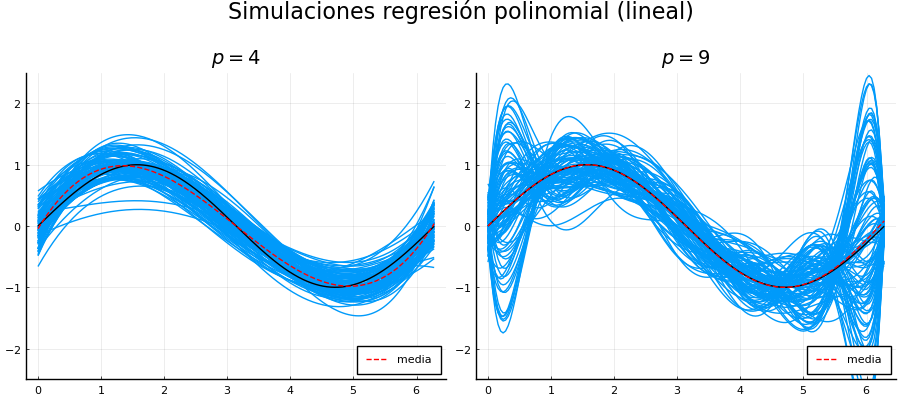

In [20]:
plt_mc = plot(plt4_mc,plt9_mc,size=(900,400),plot_title="Simulaciones regresión polinomial (lineal)")

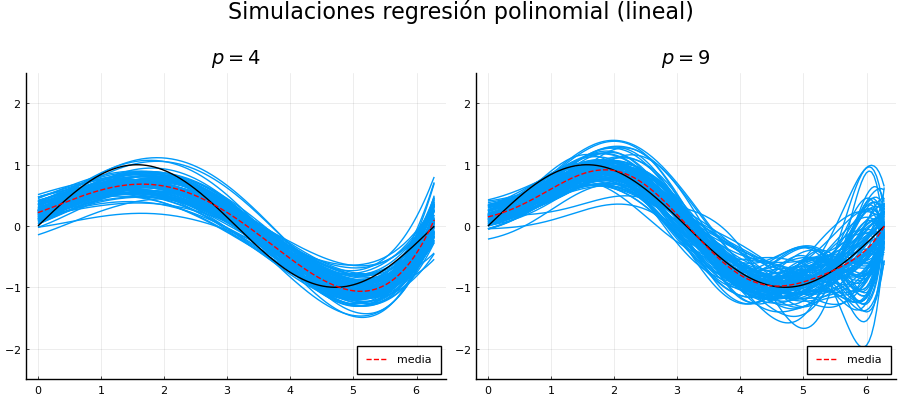

In [21]:
pltr_mc = plot(plt4r_mc,plt9r_mc,size=(900,400),plot_title="Simulaciones regresión polinomial (lineal)")

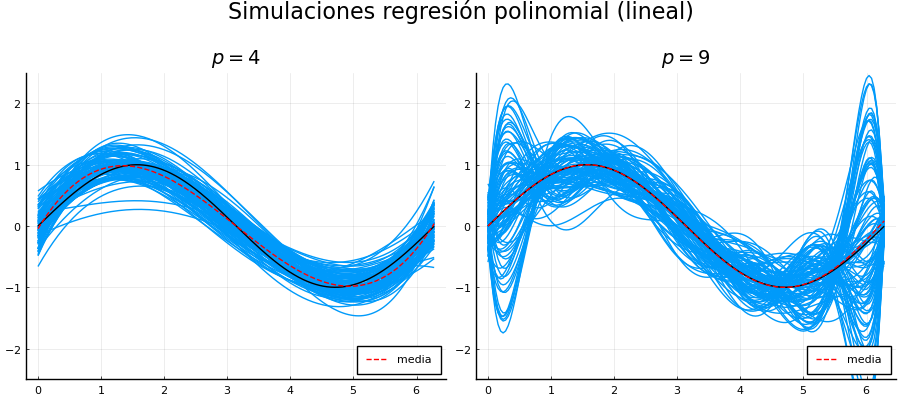

In [22]:
plt_mc

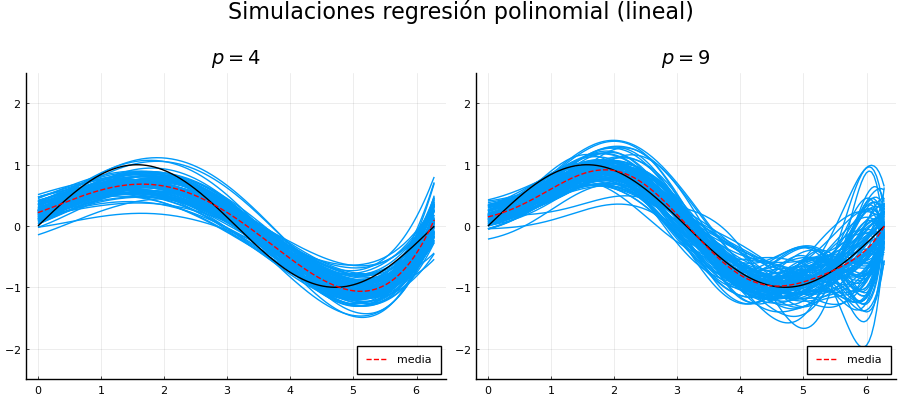

In [23]:
pltr_mc

In [24]:
using Trapz

In [25]:
# Estimación varianza integrada reg-pol p=4 con Monte-Carlo e integración con regla trapezoidal
v = trapz(collect(t_mc),var(M_4,dims=1)[1,:])

0.18100404397570352

In [26]:
# Estimación varianza reg-pol-ridge p=4 con Monte-Carlo e integración con regla trapezoidal
vr = trapz(collect(t_mc),var(M_4_r,dims=1)[1,:])

0.12187991310774075

In [27]:
# Estimación sesgo-cuadrado integrado reg-pol p=4 con Monte-Carlo e integración con regla trapezoidal
s = trapz(collect(t_mc),(mean(M_4,dims=1)[1,:] .- sin.(t_mc)).^2)

0.04350716880894909

In [28]:
# Estimación sesgo-cuadrado integrado reg-pol ridge p=4 con Monte-Carlo e integración con regla trapezoidal
sr = trapz(collect(t_mc),(mean(M_4_r,dims=1)[1,:] .- sin.(t_mc)).^2)

0.2379008461073797

In [29]:
# Riesgos estimados p=4
v+s, vr+sr

(0.2245112127846526, 0.3597807592151204)

In [30]:
# Estimación varianza integrada reg-pol p=9 con Monte-Carlo e integración con regla trapezoidal
v = trapz(collect(t_mc),var(M_9,dims=1)[1,:])

1.4159254759188304

In [31]:
# Estimación varianza reg-pol-ridge p=9 con Monte-Carlo e integración con regla trapezoidal
vr = trapz(collect(t_mc),var(M_9_r,dims=1)[1,:])

0.37554056693080584

In [32]:
# Estimación sesgo-cuadrado integrado reg-pol p=9 con Monte-Carlo e integración con regla trapezoidal
s = trapz(collect(t_mc),(mean(M_9,dims=1)[1,:] .- sin.(t_mc)).^2)

0.002191452851261467

In [33]:
# Estimación sesgo-cuadrado integrado reg-pol ridge p=9 con Monte-Carlo e integración con regla trapezoidal
sr = trapz(collect(t_mc),(mean(M_9_r,dims=1)[1,:] .- sin.(t_mc)).^2)

0.060640800027199224

In [34]:
# Riesgos estimados p=9
v+s, vr+sr

(1.4181169287700919, 0.4361813669580051)

In [53]:
using PyCall, DataFrames, StatsBase, LinearAlgebra

In [2]:
@pyimport sklearn.datasets as datasets

/home/alan/anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/image.py:167: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype=np.int):
/home/alan/anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:17: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping, defaultdict


In [3]:
boston = datasets.load_boston()

Dict{Any, Any} with 4 entries:
  "feature_names" => PyObject array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM'…
  "data"          => [0.00632 18.0 … 396.9 4.98; 0.02731 0.0 … 396.9 9.14; … ; …
  "target"        => [24.0, 21.6, 34.7, 33.4, 36.2, 28.7, 22.9, 27.1, 16.5, 18.…
  "DESCR"         => "Boston House Prices dataset\n===========================\…

### Ejemplo datos inmobiliarios

In [4]:
# Datos casas de Boston
boston_df = DataFrame(boston["data"], PyCall.py2array(String,boston["feature_names"]))

Row,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.09,1.0,296.0,15.3,396.9,4.98
2,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.9,9.14
3,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
4,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
5,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.9,5.33
6,0.02985,0.0,2.18,0.0,0.458,6.43,58.7,6.0622,3.0,222.0,18.7,394.12,5.21
7,0.08829,12.5,7.87,0.0,0.524,6.012,66.6,5.5605,5.0,311.0,15.2,395.6,12.43
8,0.14455,12.5,7.87,0.0,0.524,6.172,96.1,5.9505,5.0,311.0,15.2,396.9,19.15
9,0.21124,12.5,7.87,0.0,0.524,5.631,100.0,6.0821,5.0,311.0,15.2,386.63,29.93


In [5]:
print(boston["DESCR"])

Boston House Prices dataset

Notes
------
Data Set Characteristics:  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
      

In [6]:
X = Matrix(boston_df[:,1:end])

506×13 Matrix{Float64}:
 0.00632  18.0   2.31  0.0  0.538  6.575  …  1.0  296.0  15.3  396.9    4.98
 0.02731   0.0   7.07  0.0  0.469  6.421     2.0  242.0  17.8  396.9    9.14
 0.02729   0.0   7.07  0.0  0.469  7.185     2.0  242.0  17.8  392.83   4.03
 0.03237   0.0   2.18  0.0  0.458  6.998     3.0  222.0  18.7  394.63   2.94
 0.06905   0.0   2.18  0.0  0.458  7.147     3.0  222.0  18.7  396.9    5.33
 0.02985   0.0   2.18  0.0  0.458  6.43   …  3.0  222.0  18.7  394.12   5.21
 0.08829  12.5   7.87  0.0  0.524  6.012     5.0  311.0  15.2  395.6   12.43
 0.14455  12.5   7.87  0.0  0.524  6.172     5.0  311.0  15.2  396.9   19.15
 0.21124  12.5   7.87  0.0  0.524  5.631     5.0  311.0  15.2  386.63  29.93
 0.17004  12.5   7.87  0.0  0.524  6.004     5.0  311.0  15.2  386.71  17.1
 0.22489  12.5   7.87  0.0  0.524  6.377  …  5.0  311.0  15.2  392.52  20.45
 0.11747  12.5   7.87  0.0  0.524  6.009     5.0  311.0  15.2  396.9   13.27
 0.09378  12.5   7.87  0.0  0.524  5.889     5.0  311

In [7]:
X[:,1:end] = (X[:,1:end] .- mean(X[:,1:end],dims=1))./std(X[:,1:end],dims=1)

506×13 Matrix{Float64}:
 -0.4173     0.284548  -1.28664   …  -1.45756   0.440616  -1.0745
 -0.414859  -0.48724   -0.592794     -0.302794  0.440616  -0.491953
 -0.414861  -0.48724   -0.592794     -0.302794  0.396035  -1.20753
 -0.41427   -0.48724   -1.30559       0.11292   0.415751  -1.36017
 -0.410003  -0.48724   -1.30559       0.11292   0.440616  -1.02549
 -0.414563  -0.48724   -1.30559   …   0.11292   0.410165  -1.04229
 -0.407765   0.048724  -0.476182     -1.50375   0.426376  -0.0312367
 -0.401221   0.048724  -0.476182     -1.50375   0.440616   0.9098
 -0.393464   0.048724  -0.476182     -1.50375   0.328123   2.41938
 -0.398256   0.048724  -0.476182     -1.50375   0.329      0.622728
 -0.391876   0.048724  -0.476182  …  -1.50375   0.392639   1.09185
 -0.404371   0.048724  -0.476182     -1.50375   0.440616   0.0863929
 -0.407127   0.048724  -0.476182     -1.50375   0.370513   0.428079
  ⋮                               ⋱   ⋮                   
 -0.385515  -0.48724   -0.21089       0.3

In [8]:
y = boston["target"];

In [9]:
λ = 50.0

50.0

In [10]:
b_ridge = inv(X'*X + λ*I)*X'*y

13-element Vector{Float64}:
 -0.7162191981717345
  0.70443460010272
 -0.3066397694430638
  0.7418061575534791
 -1.2520844602961525
  2.824693454893242
 -0.12704955918768235
 -2.1790598701448847
  1.1398039341847541
 -0.840063019682082
 -1.8050278399249242
  0.8244909149638868
 -3.2758643047314067

In [28]:
hat_X = Float64.(hcat(fill!(similar(X[:,1]), 1), X))

506×14 Matrix{Float64}:
 1.0  -0.4173     0.284548  -1.28664   …  -1.45756   0.440616  -1.0745
 1.0  -0.414859  -0.48724   -0.592794     -0.302794  0.440616  -0.491953
 1.0  -0.414861  -0.48724   -0.592794     -0.302794  0.396035  -1.20753
 1.0  -0.41427   -0.48724   -1.30559       0.11292   0.415751  -1.36017
 1.0  -0.410003  -0.48724   -1.30559       0.11292   0.440616  -1.02549
 1.0  -0.414563  -0.48724   -1.30559   …   0.11292   0.410165  -1.04229
 1.0  -0.407765   0.048724  -0.476182     -1.50375   0.426376  -0.0312367
 1.0  -0.401221   0.048724  -0.476182     -1.50375   0.440616   0.9098
 1.0  -0.393464   0.048724  -0.476182     -1.50375   0.328123   2.41938
 1.0  -0.398256   0.048724  -0.476182     -1.50375   0.329      0.622728
 1.0  -0.391876   0.048724  -0.476182  …  -1.50375   0.392639   1.09185
 1.0  -0.404371   0.048724  -0.476182     -1.50375   0.440616   0.0863929
 1.0  -0.407127   0.048724  -0.476182     -1.50375   0.370513   0.428079
 ⋮                                 

In [12]:
y_pred_ridge = hat_X*[mean(y); b_ridge];

In [13]:
using Plots, LaTeXStrings
pyplot()

Plots.PyPlotBackend()

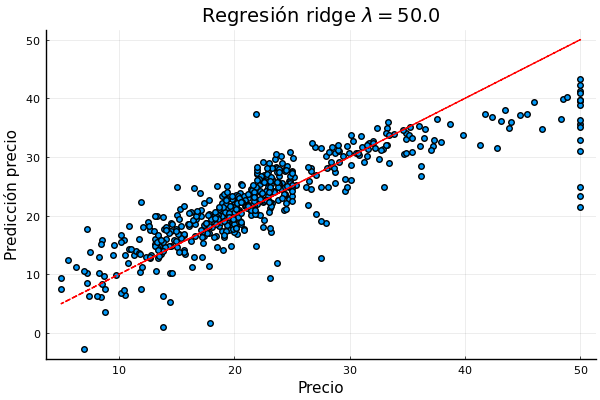

In [14]:
plt_ridge = scatter(y,y_pred_ridge,label="",xlabel="Precio",ylabel="Predicción precio")
plot!(y,y,label="",c=:red,linestyle=:dash,title=latexstring("Regresión ridge \$\\lambda=$(λ)\$"))

In [15]:
b_linreg= inv(hat_X'*hat_X)*hat_X'*y

14-element Vector{Float64}:
 22.532806324110652
 -0.9213219751548247
  1.0820503266539927
  0.1431086056223927
  0.6828785752045858
 -2.0621311502973403
  2.673284305028888
  0.021141531794744317
 -3.107520242291554
  2.6614177009182436
 -2.0779524691331797
 -2.064196654752144
  0.8574881751987022
 -3.7523895477057927

In [16]:
y_pred_linreg =  hat_X*b_linreg;

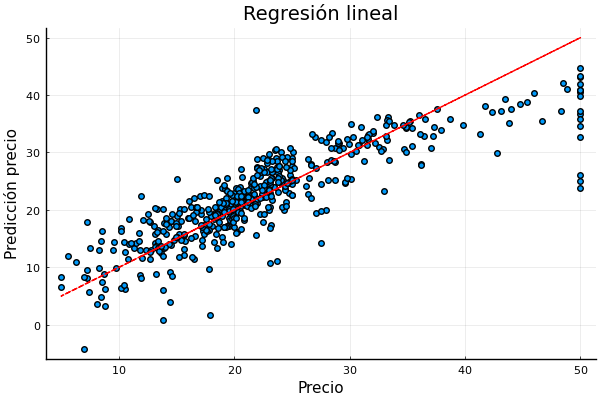

In [17]:
plt_linreg = scatter(y,y_pred_linreg,label="",xlabel="Precio",ylabel="Predicción precio")
plot!(y,y,label="",c=:red,linestyle=:dash,title="Regresión lineal")

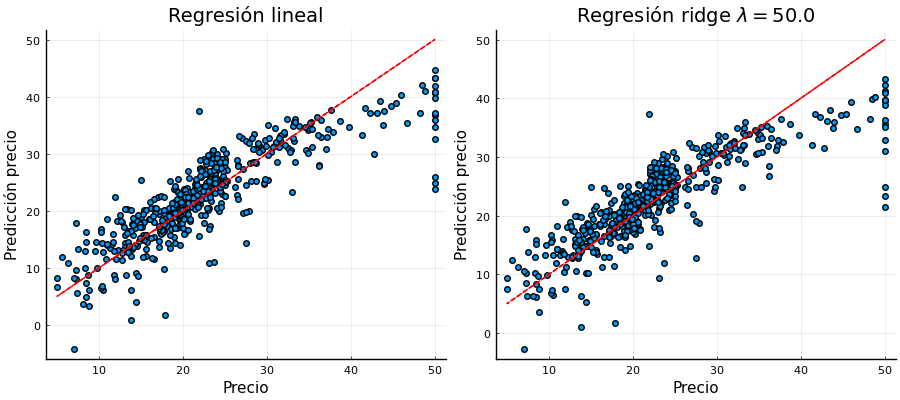

In [18]:
plt = plot(plt_linreg,plt_ridge,size=(900,400))

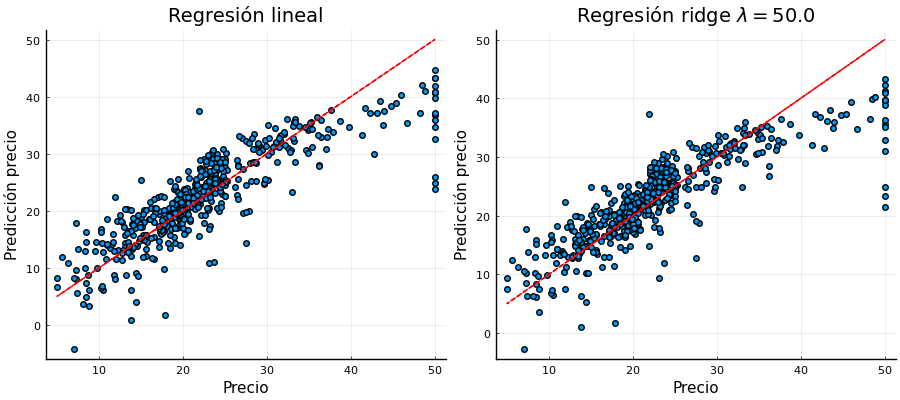

In [19]:
plt

In [20]:
# Error de predicción modelo lineal
mean( (y .- y_pred_linreg ).^2 )

21.8977792176875

In [21]:
# Error de predicción modelo cresta
mean( (y .- y_pred_ridge ).^2 )

22.653952885588446

In [22]:
# Differencia
mean( (y_pred_linreg .- y_pred_ridge ).^2 )

0.7561736679009757

In [23]:
py"""
$(X)
"""

In [35]:
λ

50.0

In [36]:
# scikit-learn en python
py"""
from sklearn.linear_model import Ridge
model = Ridge(50.0)
fit_py = model.fit($(X), $(y))
"""

In [37]:
py"fit_py.coef_"o

PyObject array([-0.7162192 ,  0.7044346 , -0.30663977,  0.74180616, -1.25208446,
        2.82469345, -0.12704956, -2.17905987,  1.13980393, -0.84006302,
       -1.80502784,  0.82449091, -3.2758643 ])

In [38]:
b_ridge

13-element Vector{Float64}:
 -0.7162191981717345
  0.70443460010272
 -0.3066397694430638
  0.7418061575534791
 -1.2520844602961525
  2.824693454893242
 -0.12704955918768235
 -2.1790598701448847
  1.1398039341847541
 -0.840063019682082
 -1.8050278399249242
  0.8244909149638868
 -3.2758643047314067

In [39]:
py"fit_py.alpha"o

PyObject 50.0

In [40]:
# intercept should be
mean(y)

22.532806324110673

In [41]:
py"fit_py.intercept_"o

PyObject 22.53280632411067

### Ejemplo datos genéticos

In [161]:
using RCall

In [162]:
R"""
load(file='../Datasets/eyedata.rda')
"""

RObject{StrSxp}
[1] "genes"  "trim32"


In [163]:
# Expresión de 120 genes para predecir la expresión del gen trim32
X = @rget genes

120×200 Matrix{Float64}:
 3.67613  3.60508  5.27939  4.83717  …  4.29972  9.1559   6.96112  3.97953
 3.58221  3.65532  5.49262  5.07404     4.32895  9.1382   7.0571   4.16044
 3.85196  3.87255  5.18339  4.56591     4.20907  9.16197  7.06101  3.87378
 4.12991  3.90026  5.31292  5.1098      4.40429  8.98709  6.99461  4.08895
 3.88041  3.75443  5.14542  5.1929      4.40322  9.30355  7.08685  3.97085
 3.6983   3.50432  5.10073  4.4933   …  4.18204  9.45275  7.67893  3.66135
 3.85453  3.73909  5.34372  4.90946     4.2563   8.96315  6.95118  4.04266
 3.72711  3.59663  5.28534  4.52241     4.05265  9.32239  7.13058  4.0563
 4.00958  3.69947  5.19657  4.79239     4.29258  9.19788  7.21599  4.00118
 3.82628  3.90616  5.64654  5.07746     4.34385  9.20731  6.99435  3.73863
 3.71681  3.75558  5.48863  4.92315  …  4.28613  9.04261  6.90952  4.15289
 3.88902  3.69407  5.39556  4.63525     4.16626  9.24356  7.12939  3.85742
 3.78512  3.81107  5.09512  4.57843     4.17221  9.43932  7.32297  3.89486
 

In [164]:
X[:,1:end] = (X[:,1:end] .- mean(X[:,1:end],dims=1))./std(X[:,1:end],dims=1)

120×200 Matrix{Float64}:
 -0.705839    -0.471418    0.0305794  -0.0614188  …  -0.837416     0.366169
 -0.969307    -0.324928    0.668263    0.595167      -0.364801     1.37746
 -0.21263      0.308371   -0.256548   -0.813326      -0.345539    -0.225037
  0.567045     0.389166    0.130859    0.694279      -0.672494     0.97784
 -0.132828    -0.0359758  -0.370089    0.92463       -0.218305     0.3176
 -0.643671    -0.765157   -0.503751   -1.01459    …   2.69707     -1.41255
 -0.205421    -0.0807174   0.222974    0.138948      -0.886362     0.719059
 -0.562854    -0.496042    0.0483681  -0.9339        -0.00299837   0.795291
  0.229498    -0.196218   -0.217109   -0.185538       0.417573     0.487199
 -0.28466      0.406357    1.12859     0.604642      -0.673769    -0.980565
 -0.591737    -0.0326212   0.656333    0.176919   …  -1.09148      1.33529
 -0.108685    -0.211959    0.378002   -0.621111      -0.00886152  -0.316495
 -0.400117     0.129156   -0.52052    -0.778611       0.944339    -0.

In [165]:
y = @rget trim32

120-element Vector{Float64}:
 8.421886538
 8.358945016
 8.405883879
 8.290471676
 8.273446954
 8.390450131
 8.295942896
 8.456627395
 8.474626348
 8.321910228
 8.380522105
 8.415174862
 8.441688376
 ⋮
 8.327587931
 8.252273978
 8.539328572
 8.377645048
 8.287714539
 8.321353375
 8.559093044
 8.604741862
 8.459056853
 8.511768511
 8.363456841
 8.116749792

In [166]:
λ = 1.1

1.1

In [167]:
λ_vec = collect(0.0:01.1:1000.0);

In [168]:
B = zeros(200,length(λ_vec))

200×910 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [171]:
for i in 1:length(λ_vec)    
    B[:,i] = inv(X'*X + λ_vec[i]*I)*X'*y
end

In [174]:
p =plot(λ_vec,B[1,:],label="",ylim=(-0.02,0.02))
for i in 2:200    
    plot!(λ_vec,B[i,:],label="")
    xlabel!(L"\lambda")
    ylabel!(L"\beta_i")
end

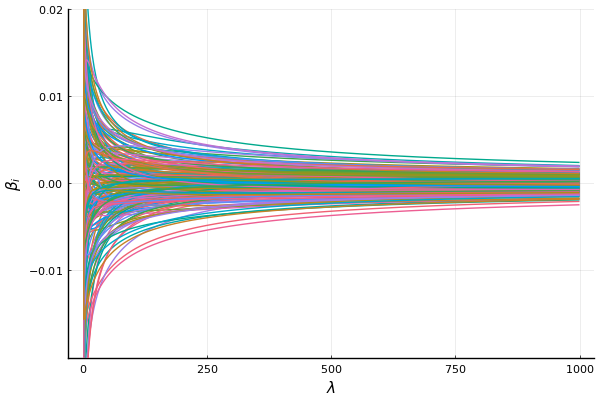

In [175]:
p

In [177]:
hat_X = Float64.(hcat(fill!(similar(X[:,1]), 1), X))

120×201 Matrix{Float64}:
 1.0  -0.705839    -0.471418    0.0305794  …  -0.837416     0.366169
 1.0  -0.969307    -0.324928    0.668263      -0.364801     1.37746
 1.0  -0.21263      0.308371   -0.256548      -0.345539    -0.225037
 1.0   0.567045     0.389166    0.130859      -0.672494     0.97784
 1.0  -0.132828    -0.0359758  -0.370089      -0.218305     0.3176
 1.0  -0.643671    -0.765157   -0.503751   …   2.69707     -1.41255
 1.0  -0.205421    -0.0807174   0.222974      -0.886362     0.719059
 1.0  -0.562854    -0.496042    0.0483681     -0.00299837   0.795291
 1.0   0.229498    -0.196218   -0.217109       0.417573     0.487199
 1.0  -0.28466      0.406357    1.12859       -0.673769    -0.980565
 1.0  -0.591737    -0.0326212   0.656333   …  -1.09148      1.33529
 1.0  -0.108685    -0.211959    0.378002      -0.00886152  -0.316495
 1.0  -0.400117     0.129156   -0.52052        0.944339    -0.107187
 ⋮                                         ⋱                ⋮
 1.0  -0.00315355   0.

In [178]:
F = svd(X)

SVD{Float64, Float64, Matrix{Float64}, Vector{Float64}}
U factor:
120×120 Matrix{Float64}:
  0.00571708    0.0412721   -0.185444     …   0.0460512    0.0912871
  0.0251537     0.069835    -0.0516846       -0.0490613    0.0912871
  0.000259122   0.0495855   -0.0667573        0.120532     0.0912871
  0.0734866     0.0994823   -0.0154584        0.00346045   0.0912871
  0.00549567   -0.0117939   -0.118218        -0.0482445    0.0912871
 -0.107231      0.00430909   0.150276     …   0.0118579    0.0912871
  0.0557621     0.0912615   -0.152158        -0.0589494    0.0912871
 -0.0746802     0.0377563   -0.0616527       -0.0915824    0.0912871
 -0.0292263     0.0353533   -0.0445757       -0.145789     0.0912871
  0.0686781     0.057777    -0.0674267       -0.108978     0.0912871
  0.0525466     0.0839253   -0.144107     …   0.0499131    0.0912871
 -0.0142973     0.0688524   -0.044893         0.000974423  0.0912871
 -0.0840885    -0.125284    -0.0893404       -0.013367     0.0912871
  ⋮         

In [179]:
R = F.U*Diagonal(F.S)

120×120 Matrix{Float64}:
   0.690092    1.83821   -4.7631      1.73872   …   0.0656674   3.31472e-14
   3.03623     3.11037   -1.32751    -0.426178     -0.0699598   3.31472e-14
   0.0312778   2.20848   -1.71465    -0.48603       0.171874    3.31472e-14
   8.87035     4.43083   -0.397047   -1.41992       0.00493448  3.31472e-14
   0.663366   -0.525288  -3.03641    -3.00347      -0.0687951   3.31472e-14
 -12.9435      0.191922   3.85981    -7.85852   …   0.0169089   3.31472e-14
   6.73088     4.06468   -3.90815    -0.059029     -0.0840599   3.31472e-14
  -9.01442     1.68162   -1.58354    -0.747237     -0.130594    3.31472e-14
  -3.52782     1.57459   -1.14492    -1.99588      -0.20789     3.31472e-14
   8.28993     2.57332   -1.73185    -2.00776      -0.155399    3.31472e-14
   6.34275     3.73793   -3.70138     1.72151   …   0.0711744   3.31472e-14
  -1.72578     3.06661   -1.15307    -1.1721        0.0013895   3.31472e-14
 -10.1501     -5.58      -2.29469    -0.888315     -0.0190609  

In [180]:
b_ridge2 = F.V*inv(R'*R+λ*I)*R'*y

200-element Vector{Float64}:
 -0.015785526578467213
 -0.006079720936171503
  0.007634117798773928
  0.017486128000266103
 -0.006348439205879571
  0.001283564613787265
 -0.0013021247013290187
 -0.02147407551395398
  0.00275877484606398
  0.0006954230232489927
  0.012086498192641001
 -0.0032734927967406867
  0.019666042067788398
  ⋮
  0.0074648677109084615
  0.006029869242336651
  0.021813300758267092
  0.009608955580383672
  0.00897912847815594
  0.0008391623256337275
 -0.007997717896969719
  0.014016156598716023
 -0.00803950171016828
 -0.0055548638232443635
 -0.0051710661090764625
 -0.015597803861798874

In [181]:
y_pred_ridge = hat_X*[mean(y); b_ridge];

In [184]:
mean( (b_ridge.-b_ridge2).^2 )

0.00037062859557150955

In [183]:
mean( (y .- y_pred_ridge).^2.0 )

0.3956866357662901